[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://drive.google.com/file/d/137os8BncrPjNvHEQjihPOjrAMTu6ub0z/view?usp=sharing)
# **EDA and Regression Modeling for WiDS Datathon 2024 Challenge #2**

# **`1.` Abstract**

This notebook presents the exploratory data analysis (EDA) and regression modeling undertaken for the WiDS Datathon 2024 Challenge #2. The primary goal of this challenge is to predict the duration required for patients to receive a metastatic cancer diagnosis, using a range of patient and socio-economic characteristics.

The dataset comprises approximately 19,000 records of breast cancer patients, enriched with 151 features encompassing demographic, treatment, insurance, and climate data. The target variable, metastatic_diagnosis_period, represents the time in days until a metastatic cancer diagnosis is made. Key features include patient_id, patient_race, patient_age, bmi, income_household_median, education_stem_degree, and Average Temperature. For a more detailed data description review the competition page on [**Kaggle**](https://www.kaggle.com/competitions/widsdatathon2024-challenge2).

The initial data preparation phase focused on identifying and addressing dataset inconsistencies to ensure reliable analysis and model training. A tailored imputation strategy was employed for each feature, with RMSE scores used to assess the effectiveness of different imputation techniques across various models.

Feature selection was a critical component in the analysis, with mutual information and correlation analysis used to assess the informational value of each feature. Informative features with strong correlations to the target variable were further analyzed using KMeans clustering, enhancing feature representation. Redundant features were removed to optimize data quality before imputation.

The notebook also details the evaluation of various regression models—CatBoost, GradientBoosting, and LGBM—each incorporating specific imputation techniques. The comparative results from these models aim to identify the most effective approach for predicting the duration until metastatic diagnosis.

#`2.` **Table of Contents**

- [Exploratory Data Analysis](#eda)
  - [1. Initial Data Inspection](#initial)
  - [2. Variable Analysis](#v_analysis)
- [Data Cleaning](#data_cleaning)
  - [1. Inconsistent Data](#inconsisten_data)
  - [2. Missing Data](#missing)
  - [3. Mutual Info and Pairwise Correlation](#corr)
  - [4. Data Imputation Techniques](#imputation_tech)
  - [5. Impute Data](#impute_data)
  - [6. Generate Features](#gen_feats)
- [Regression Modeling](#regression)
  - [1. Establish Baseline Scores and SHAP for Feature Importance](#baseline)
  - [2. Backward Selection](#backward)
  - [3. Hyperparameter Tuning](#hyp_tuning)
  - [4. K-Fold Cross-Validation for Predictive Modelling](#k_fold)
  - [5. Stacking Meta-Model](#oof)
  - [6. Submission Files](#submission)
- [Conclusion](#conclusion)
- [References and Acknowledgments](#references)

# **`3.` Exploratory Data Analysis (EDA)**
<a name="eda"></a>

## **`1.` Google Drive Mount**

In [ ]:
from google.colab import drive

# Try unmounting first if it's already mounted
# !fusermount -u /content/drive

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


## **`2.` Required Libraries**

In [ ]:
import warnings
warnings.filterwarnings('ignore')

!pip install dask[dataframe] --quiet
from google.colab import files

from pathlib import Path
import numpy as np
import pandas as pd
import random
import os
import re

import seaborn as sns
import matplotlib.pyplot as plt

!pip install matplotlib --upgrade --quiet
from matplotlib import rcParams
import plotly.express as px
import plotly.graph_objects as go

import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy import stats
from scipy.stats import chi2_contingency, ks_2samp
from sklearn.cluster import KMeans

from sklearn.feature_selection import mutual_info_regression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import StratifiedKFold,  KFold, train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, make_scorer, davies_bouldin_score, silhouette_score

!pip install catboost --quiet
from catboost import CatBoostRegressor, Pool
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.linear_model import LinearRegression, Ridge

!pip install optuna --quiet
import optuna

!pip install shap --quiet
import shap

from datetime import datetime

# Setting the path to the directory containing the notebook and importing the DataImputer class
path = "/content/drive/MyDrive/Colab Notebooks/Kaggle/WiDS Datathon/"
notebook_path = Path(os.path.join(path, "ImputationTechniques.ipynb"))
os.chdir(notebook_path.parent)

!pip install import-ipynb --quiet
import import_ipynb
from ImputationTechniques import DataImputer
data_imputer = DataImputer()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 21.9 MB/s eta 0:00:00


## **`3.` Configuration**

In [ ]:
# Random seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)

pd.set_option('display.max_columns', 155)
pd.set_option('display.max_rows', 150)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set Matplotlib defaults
plt.style.use('fivethirtyeight')
rcParams['figure.figsize'] = [5,3]
rcParams.update({'font.size': 8})

## **`4.` Get the data**


In [ ]:
zip_path = os.path.join(path, "widsdatathon2024-challenge2.zip")
dir = os.path.join('..', 'wids')

from zipfile import ZipFile
with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(dir)

In [ ]:
train_raw = pd.read_csv(os.path.join(dir, "train.csv"))
test_raw = pd.read_csv(os.path.join(dir, 'test.csv'))
ss = pd.read_csv(os.path.join(dir, 'solution_template.csv'))

train_raw.shape, test_raw.shape, ss.shape

((13173, 152), (5646, 151), (5646, 2))

## **`5.` Initial Data Inspection**
<a name="initial"></a>

In [ ]:
train_raw.head()

,patient_id,patient_race,payer_type,patient_state,patient_zip3,Region,Division,patient_age,patient_gender,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,metastatic_first_novel_treatment,metastatic_first_novel_treatment_type,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Average of Jan-13,Average of Feb-13,Average of Mar-13,Average of Apr-13,Average of May-13,Average of Jun-13,Average of Jul-13,Average of Aug-13,Average of Sep-13,Average of Oct-13,Average of Nov-13,Average of Dec-13,Average of Jan-14,Average of Feb-14,Average of Mar-14,Average of Apr-14,Average of May-14,Average of Jun-14,Average of Jul-14,Average of Aug-14,Average of Sep-14,Average of Oct-14,Average of Nov-14,Average of Dec-14,Average of Jan-15,Average of Feb-15,Average of Mar-15,Average of Apr-15,Average of May-15,Average of Jun-15,Average of Jul-15,Average of Aug-15,Average of Sep-15,Average of Oct-15,Average of Nov-15,Average of Dec-15,Average of Jan-16,Average of Feb-16,Average of Mar-16,Average of Apr-16,Average of May-16,Average of Jun-16,Average of Jul-16,Average of Aug-16,Average of Sep-16,Average of Oct-16,Average of Nov-16,Average of Dec-16,Average of Jan-17,Average of Feb-17,Average of Mar-17,Average of Apr-17,Average of May-17,Average of Jun-17,Average of Jul-17,Average of Aug-17,Average of Sep-17,Average of Oct-17,Average of Nov-17,Average of Dec-17,Average of Jan-18,Average of Feb-18,Average of Mar-18,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18,metastatic_diagnosis_period
0,268700,NaN,COMMERCIAL,AR,724,South,West South Central,39,F,NaN,C50912,Malignant neoplasm of unspecified site of left...,C773,NaN,NaN,3924.870,82.630,42.580,11.610,13.030,10.870,11.800,12.290,13.220,13.470,10.070,3.640,51.430,48.570,51.050,16.720,23.570,8.660,3.010,43.990,44483.350,2.210,3.970,8.520,7.080,7.670,13.820,15.140,17.510,11.260,8.900,3.930,12.830,24048.550,72.110,1513.750,87384.330,641.390,27.520,16.550,41.830,28.310,9.210,4.110,13.320,38.780,53.600,5.850,11.820,5.310,92.950,1.730,0.330,0.200,0.030,0.830,3.940,3.030,22.240,19.270,0.420,25.350,8.060,8.110,38.550,39.880,42.750,55.160,65.170,75.980,76.750,76.450,73.670,59.730,45.180,37.430,31.670,33.830,42.350,57.720,67.350,75.920,74.280,79.590,70.840,62.390,41.890,41.460,35.240,31.100,45.500,60.940,68.490,77.690,81.350,76.280,73.320,60.320,51.000,48.370,35.760,42.890,53.210,61.070,66.290,82.780,81.520,79.520,75.610,65.760,53.850,39.560,41.590,49.010,52.280,63.400,67.110,75.780,80.580,76.160,72.910,62.680,49.730,39.800,31.710,41.690,50.220,52.550,74.770,79.960,81.690,78.300,74.560,59.980,42.980,41.180,191
1,484983,White,NaN,IL,629,Midwest,East North Central,55,F,35.360,C50412,Malig neoplasm of upper-outer quadrant of left...,C773,NaN,NaN,2745.390,51.790,43.540,11.220,12.190,11.450,11.010,11.350,14.390,14.150,9.170,5.050,49.320,50.680,49.480,15.420,26.930,8.170,3.170,41.410,51796.790,3.670,3.860,6.580,5.580,5.38

- **Describe Data**

This report will provide a summary of the statistical properties for each numerical column in the dataset to gain insights into the data distribution and identify any potential missing values, which will be examined in detail later to ensure data quality and integrity.

In [ ]:
train_raw.drop(columns=['patient_zip3', 'patient_id']).describe().transpose()


,count,mean,std,min,25%,50%,75%,max
patient_age,13173.000,59.271,13.219,18.000,50.000,59.000,67.000,91.000
bmi,4102.000,29.169,5.753,15.000,24.825,28.580,33.000,97.000
population,13173.000,20651.374,13840.380,635.550,9160.340,18952.780,30021.280,71374.130
density,13173.000,1776.872,3876.062,0.920,163.150,700.340,1666.520,29851.690
age_median,13173.000,40.543,4.031,20.600,37.190,40.640,42.940,54.570
age_under_10,13173.000,11.105,1.512,0.000,10.150,11.000,12.140,17.680
age_10_to_19,13173.000,12.858,1.952,6.310,11.650,12.900,13.910,35.300
age_20s,13173.000,13.297,3.390,5.930,11.000,12.530,14.970,62.100
age_30s,13173.000,12.894,2.411,1.500,11.270,12.400,14.130,25.470
age_40s,13173.000,12.064,1.249,0.800,11.350,12.120,12.860,17.820


- **Duplicated Data**

In [ ]:
train_raw.duplicated().sum(), test_raw.duplicated().sum()

(0, 0)

## **`6.` Variable Analysis**
<a name="v_analysis"></a>



In [ ]:
def cat_num_features(df):
    cat_features = df.select_dtypes(include=['object', 'category']).columns.tolist()
    num_features = df.select_dtypes(exclude=['object', 'category']).columns.tolist()
    return cat_features, num_features


Some features are grouped here to review their distribution, providing a brief description of the dataset. While certain features directly relate to the patient (e.g., race, payer type), many others reflect **environmental** and **demographic** characteristics based on the patient's zip code. These features offer insights into the **socioeconomic** and **geographic** contexts in which patients live, such as income, education levels, and population density in their respective regions.

In [ ]:
TARGET = 'metastatic_diagnosis_period'

train_analysis = train_raw.drop('patient_id', axis=1)

cat_features, num_features = cat_num_features(train_analysis)

# Group columns by specific categories
patient_related_cols = [col for col in num_features if col.startswith('pa')] # demographic features
patient_related_cols.append('bmi')

# Other features related to its group
economic_cols = ['income_household_median','home_ownership', 'unemployment_rate']
education_cols = ['education_less_highschool', 'education_highschool', 'education_bachelors', 'education_college_or_above', 'education_graduate', 'education_stem_degree']
loc_cols = ['population', 'density']

- **Plot Function**

In [ ]:
# The plots of the required visualizations
def plot_features(features, data=train_analysis, plot_type='dist', target=TARGET, xlabel='', ylabel='', title=None, figsize_org=(3, 4), threshold=None, colors=('blue', 'orange', 'red', 'green', 'salmon'), data_std=None, group_feature='', **kwargs):
    # Create a figure with subplots
    n_feats = len(features)

    num_cols = n_feats if n_feats < 4 else 2 if n_feats == 4 else 3
    num_rows = int(np.ceil(n_feats / num_cols))
    figsize = (figsize_org[0] * num_cols * 2, figsize_org[1] * num_rows)

    if plot_type == 'scores':
      models = list(data['model_name'].unique())
      # Visualize the distribution of 5 features for each model
      n_models = len(models)
      n_features = len(features)

      plt.figure(figsize=(n_features * 4, n_models * 3))
      for model_index, model in enumerate(models):
          # Filter the model's data
          model_data = data[data['model_name'] == model]
          fold = model_data['Fold'].unique()[0]

          for feature_index, feature in enumerate(features):
              plt.subplot(n_models, n_features, model_index * n_features + feature_index + 1)
              # Plot the distribution
              sns.lineplot(x=model_data['n_feats'], y=model_data[feature], marker='o', color=colors[feature_index], **kwargs)

              plt.title(f'{fold} - {model}')
              plt.xlabel('Number of Features')
              plt.ylabel(feature)

      plt.tight_layout()

    # Plot comparison
    elif plot_type == 'comparison_num' and threshold is not None:
        # Split data based on threshold for metastatic_diagnosis_period
        high_period = data[data[target] > threshold]
        low_period = data[data[target] <= threshold]

        # Calculate the means for both groups
        high_features_mean = high_period[features].mean()
        low_features_mean = low_period[features].mean()

        # Visualization
        plt.figure(figsize=figsize_org)
        plt.bar(features, high_features_mean, width=0.4, label='High Diagnosis Period', align='center', color=colors[0], **kwargs)
        plt.bar(features, low_features_mean, width=0.4, label='Low Diagnosis Period', align='edge', color=colors[1], **kwargs)
        plt.xticks(rotation=45)
        plt.ylabel(f'Average {xlabel} Proportion')
        if title:
            plt.title(title)
        plt.legend()

    elif plot_type == 'comparison_cat' and threshold is not None:
        # Split data based on threshold for metastatic_diagnosis_period
        high_period = data[data[target] > threshold]
        low_period = data[data[target] <= threshold]

        # Calculate the proportions for each category in high and low periods
        high_features_prop = high_period[features].apply(lambda x: x.value_counts(normalize=True)).fillna(0)
        low_features_prop = low_period[features].apply(lambda x: x.value_counts(normalize=True)).fillna(0)

        plt.figure(figsize=figsize_org)
        width = 0.4  # Bar width for both groups

        # Iterate over each feature to plot proportions
        for i, feature in enumerate(features):
            high_prop = high_features_prop[feature]
            low_prop = low_features_prop[feature]

            # Categories for the feature
            categories = high_prop.index.union(low_prop.index)

            # Plot bars for high and low periods
            plt.bar([x - width/2 for x in range(len(categories))], high_prop, width=width, label='High Diagnosis Period', align='center', color=colors[0], **kwargs)
            plt.bar([x + width/2 for x in range(len(categories))], low_prop, width=width, label='Low Diagnosis Period', align='center', color=colors[1], **kwargs)

            plt.xticks(range(len(categories)), categories, rotation=45)
            plt.ylabel(f'Proportion of {feature}')
            if title:
                plt.title(title)
            plt.legend()

    elif plot_type == 'groups':
        plt.figure(figsize=(5 * len(features), 4))
        for i, f in enumerate(features):
            plt.subplot(1, len(features), i + 1)
            sns.histplot(data[data[group_feature] == i][target], kde=True, **kwargs)
            plt.title(f'{target} Group {i} Distribution')
            plt.xlabel(xlabel)
            plt.ylabel(ylabel)
        plt.tight_layout()

    else:
        plt.figure(figsize=figsize)
        for i, feature in enumerate(features):
            plt.subplot(num_rows, num_cols, i + 1)

            # Plot type selection
            if plot_type == 'hist':
                sns.histplot(data[feature], kde=True, **kwargs)
                plt.ylabel('Frequency')
            elif plot_type == 'dist':
                sns.distplot(data[feature], kde=True, **kwargs)
                plt.ylabel('Frequency')
            elif plot_type == 'scatter' and target is not None:
                sns.scatterplot(data=data, x=feature, y=target, **kwargs)
                plt.ylabel(target)
            elif plot_type == 'box':
                sns.boxplot(data=data, x=feature, y=target, **kwargs)
                plt.xticks(rotation=40 if feature != 'payer_type' and 'novel' not in feature else 0, ha='right')
                plt.ylabel('Value')
            elif plot_type == 'violin':
                sns.violinplot(x=data[feature], **kwargs)
                plt.ylabel('Value')
            elif plot_type == 'count':
                sns.countplot(x=feature, data=data, **kwargs)
                plt.xticks(rotation=45)
                plt.ylabel('Count')
            elif plot_type == 'bar':
                sns.barplot(x=feature, y=target, data=data, **kwargs)
                plt.xticks(rotation=45)
                plt.ylabel('Value')
            elif plot_type == 'line':
                plt.plot(data.index, data[feature], marker='o', **kwargs)
                plt.xlabel(xlabel)
                plt.ylabel(ylabel)
                plt.legend()
                plt.grid(True)
                plt.xticks(rotation=45)
            elif plot_type == 'errorbar':
                if data_std is not None:
                    plt.errorbar(data.index,
                                data[feature],
                                yerr=data_std[feature],  # Error bars (std)
                                marker='o', **kwargs)
                plt.xlabel(xlabel)
                plt.ylabel(ylabel)
                plt.legend()
                plt.grid(True)
                plt.xticks(rotation=45)
            if title:
                plt.title(title)
            else:
                plt.title(feature)
            plt.xlabel(xlabel)

    plt.tight_layout()
    plt.show()


def print_bold(text):
    print(f"\033[1m{text}\033[0m", end="")

### **`1.` Univariate Analysis**

#### **`-` Target Variable**

The distribution of the target feature -**metastatic_diagnosis_period**- shows a highly skewed pattern. Most values are concentrated around 0, with a significant peak at 0. The long tail extending up to 400 indicates the presence of some outliers, which could represent patients with unusually long diagnosis periods.


       metastatic_diagnosis_period
count                    13173.000
mean                        96.515
std                        108.970
min                          0.000
25%                          3.000
50%                         44.000
75%                        181.000
max                        365.000


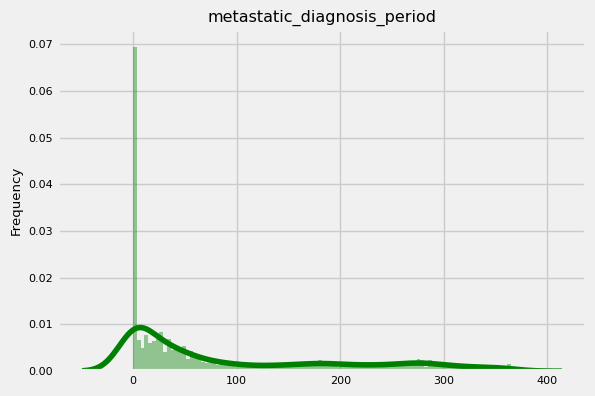

In [ ]:
# Plot metastatic_diagnosis_period distribution
print(train_analysis[[TARGET]].describe())

plot_features([TARGET], plot_type='dist', color='g', bins=100, hist_kws={'alpha': 0.4})

#### **`-` Quantitative Variables**

 **`I.` Patient-Related**

Although numerical, **patient_zip3** is represented as geographical categories, it can still be interpreted in the quantitative part. The graph shows that most patients are middle-aged, with a peak around 60 years. The **bmi** distribution appears relatively normal but is slightly skewed towards higher values, indicating a tendency for higher BMI levels among the patients.

Patient-Related Features

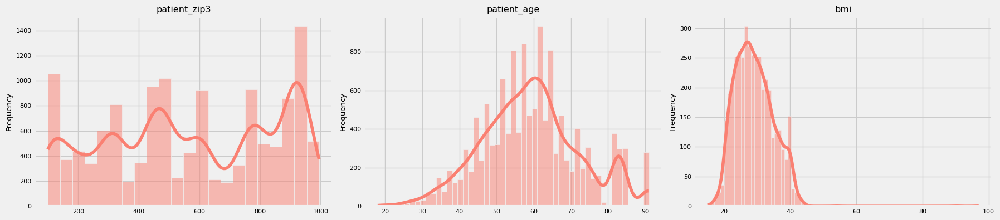

In [ ]:
print_bold('Patient-Related Features')
plot_features(patient_related_cols, plot_type='hist', color="salmon")

**`II.` Socio-Economic**

Most households fall into middle-income categories, with a peak around $60,000. Home ownership is common, especially around 80%. Unemployment rates are mostly moderate, peaking around 5%, with fewer areas showing higher unemployment.

Economic Features

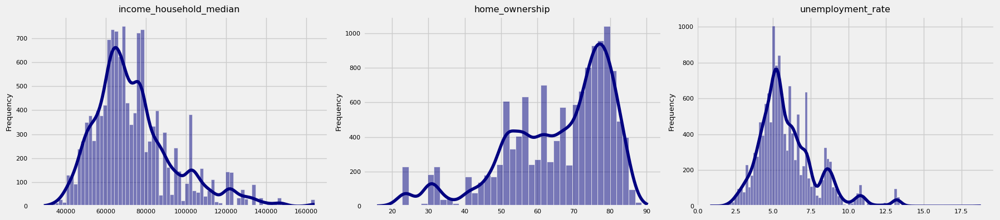

In [ ]:
print_bold('Economic Features')
plot_features(economic_cols, plot_type='hist', color="navy")

When examining the distributions of education levels, certain patterns become apparent. The frequency of individuals with less than a high school education is primarily concentrated between 5-15%, indicating a smaller proportion in this category. For high school graduates, the distribution is balanced, with higher frequency values between 20-35%, suggesting that this level of education is relatively common. The distribution of individuals with a bachelor’s degree shows two distinct peaks, which may reflect subgroups within this category.

Those with a college degree or higher are distributed across a wider range, with densities from 15-45%, showing a broader spread within this educational level. Graduate degree holders have a sharper concentration around 10%, suggesting a higher frequency at specific points in the distribution. Finally, individuals with a STEM degree are primarily concentrated between 30-50%, indicating a clustering within this range.

Education Features

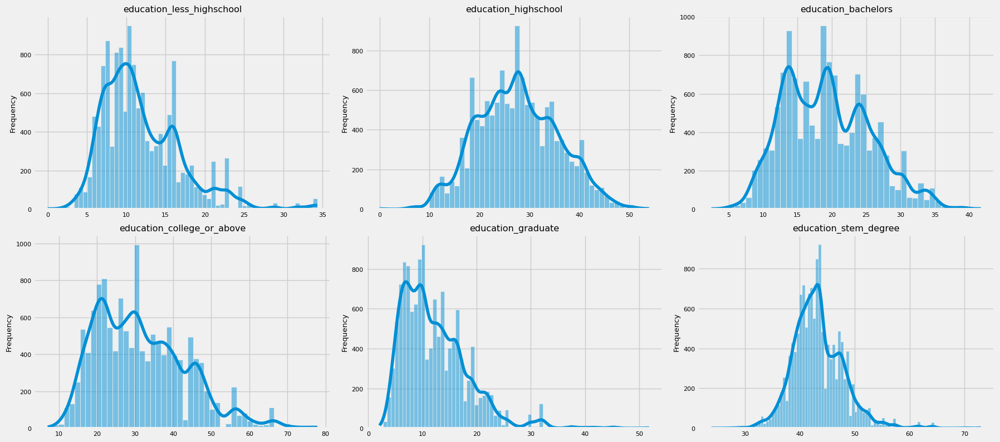

In [ ]:
print_bold('Education Features')
plot_features(education_cols, plot_type='hist')

**`III.` Environmental**

The population distribution is primarily concentrated between 0 and 30,000, indicating that most areas have relatively low population figures. Regions with low population density have a higher frequency of data points, while highly populated urban areas are less frequently represented.

The population density graph exhibits a markedly right-skewed distribution. Most of the density is clustered at lower levels, with only a few areas showing significantly high population densities. These regions with very high population density are sparse and rarely encountered in the dataset.

Location Features

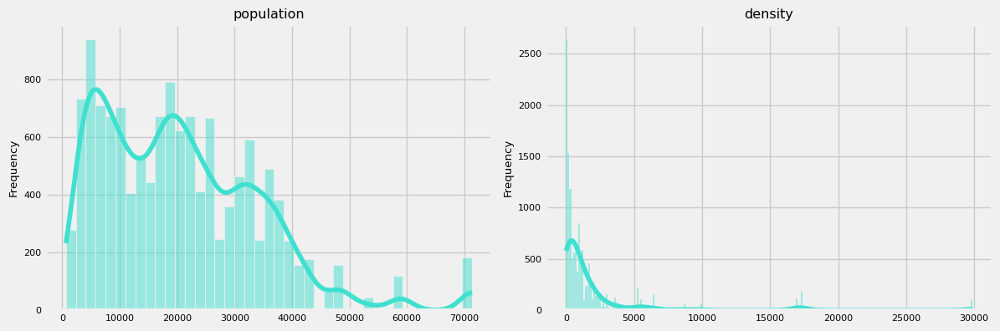

In [ ]:
print_bold('Location Features')
plot_features(loc_cols, plot_type='hist', color="turquoise")

- **Outliers**

Outliers are rare yet significant observations that fall outside the normal distribution of the dataset. Upon examining the visuals to identify extreme values in certain features, a few outliers emerge in the population distribution, with values reaching up to 70,000. A similar pattern is noted in population density, where several regions exhibit extreme values of 10,000 and above. Noteworthy extreme values also appear in terms of income averages.

While the **Body Mass Index** (BMI) primarily clusters between 20 and 40, outliers extend to 60 and beyond.

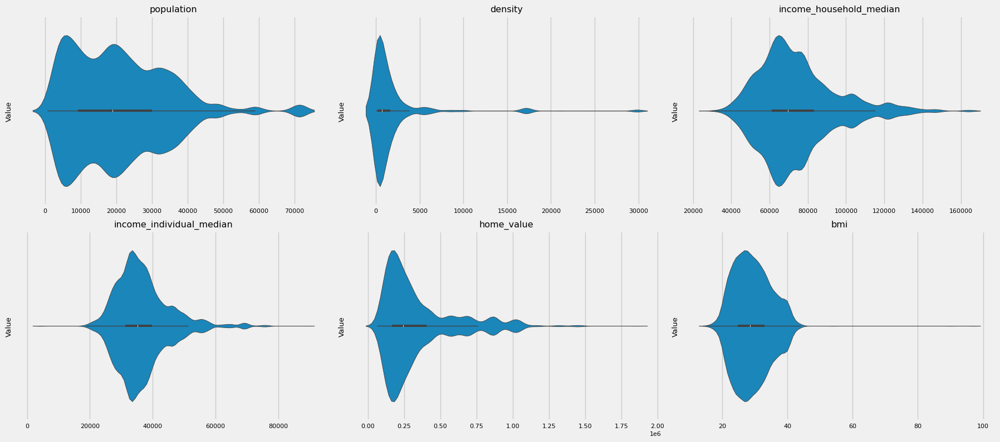

In [ ]:
feats = ['population', 'density', 'income_household_median', 'income_individual_median', 'home_value', 'bmi']
plot_features(feats, plot_type='violin')

#### **`-` Qualitative Variables**

In [ ]:
# cat_features = train_analysis.select_dtypes("object").columns.to_list()
cat_features, num_features = cat_num_features(train_analysis)
cat_features.remove('breast_cancer_diagnosis_desc')

demo_geo_cols = cat_features[:5]
diag_treat_cols = cat_features[6:]

**`I.` Demographic and Geographic**

The visual demonstrates a marked skew in patient race distribution, with **White** individuals forming the majority of the dataset, while **Black** and **Hispanic** populations contribute smaller but still significant proportions. In terms of payer type, which refers to the type of insurance coverage patients hold during a cancer diagnosis, most are covered by commercial insurance. The remaining patients are almost equally divided between **Medicaid** and **Medicare Advantage**.

The geographical distribution shows substantial variation across states, with **California** standing out as the state with the highest patient concentration. Most other states have relatively fewer patients. At a regional level, the majority of patients are from the **Southern** and **Midwestern** regions, with the **Western** region following closely. Regarding divisions, the largest patient concentrations are found in the **East North Central** and **Pacific** divisions, while other divisions exhibit a more evenly distributed, moderate number of patients across the dataset.

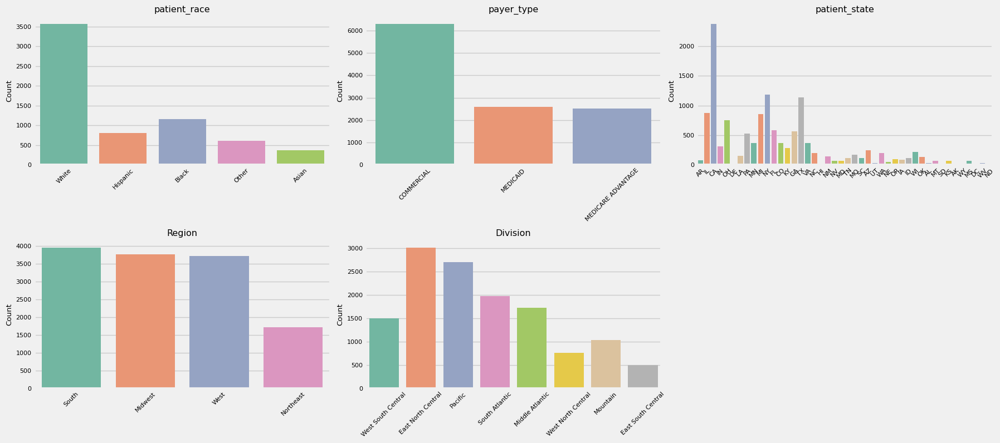

In [ ]:
plot_features(demo_geo_cols, plot_type='count', palette='Set2')

**`II.` Medical Diagnosis and Treatment**

The **breast_cancer_diagnosis_code** shows a high concentration in a limited number of categories, with fewer instances in other, less common diagnostic categories. Similarly, **metastatic_cancer_diagnosis_code** has a high concentration in one specific code, with other codes appearing less frequently.

For metastatic cancer treatments, the data highlights the frequency of **Olaparib and Pembrolizumab** as prominent treatment options, with **Antineoplastics** being the only treatment type recorded for novel therapies in these cases. This reflects a consistent treatment pattern among patients receiving these therapies.

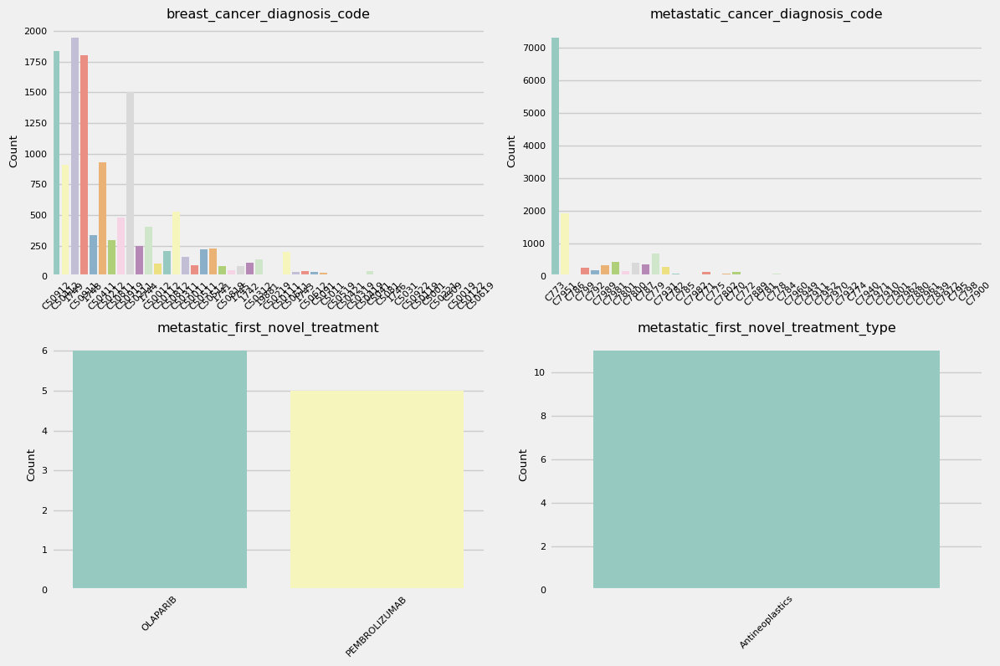

In [ ]:
plot_features(diag_treat_cols, plot_type='count', palette='Set3')

### **`2.` Bivariate Analysis**

The following charts display the distribution of **payer_type** (insurance type) across different features. Commercial insurance is the most dominant in regions like the South and Midwest, while Medicaid and Medicare Advantage show more balance in other regions and states.

In terms of race, commercial insurance is most common among White patients, while Medicaid and Medicare Advantage are more evenly distributed among Black, Hispanic, and Other racial groups.

Both **breast_cancer_diagnosis_code** and **metastatic_cancer_diagnosis_code** highlight distinct patient groupings, with patient counts varying across different payer_types within specific diagnosis codes.

Distribution of Features by metastatic_diagnosis_period

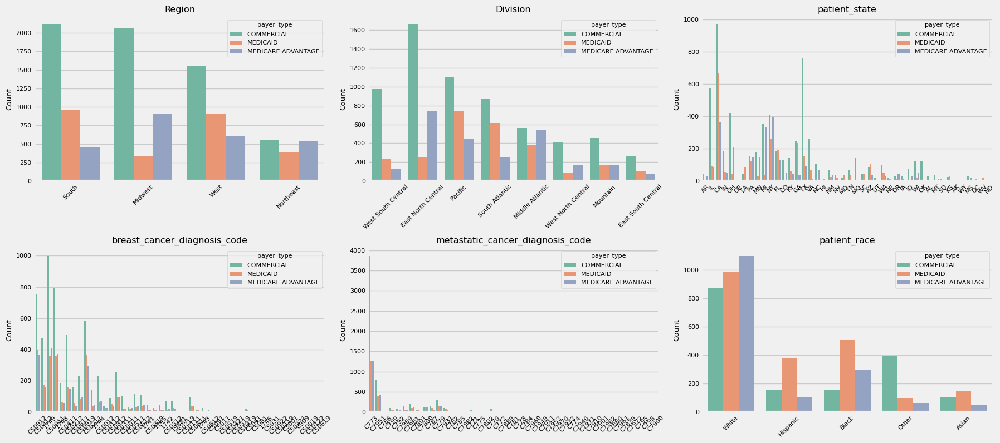

In [ ]:
features = ['Region', 'Division', 'patient_state', 'breast_cancer_diagnosis_code', 'metastatic_cancer_diagnosis_code', 'patient_race']
print_bold(f'Distribution of Features by {TARGET}')
plot_features(features, plot_type='count', hue='payer_type', palette='Set2')

The following charts display the distribution of **patient_race** across  various features.White individuals are predominant in regions like the Midwest and West, while Hispanic, Black, Asian, and Other groups are more evenly represented in other regions and states.

Distribution of Features by metastatic_diagnosis_period

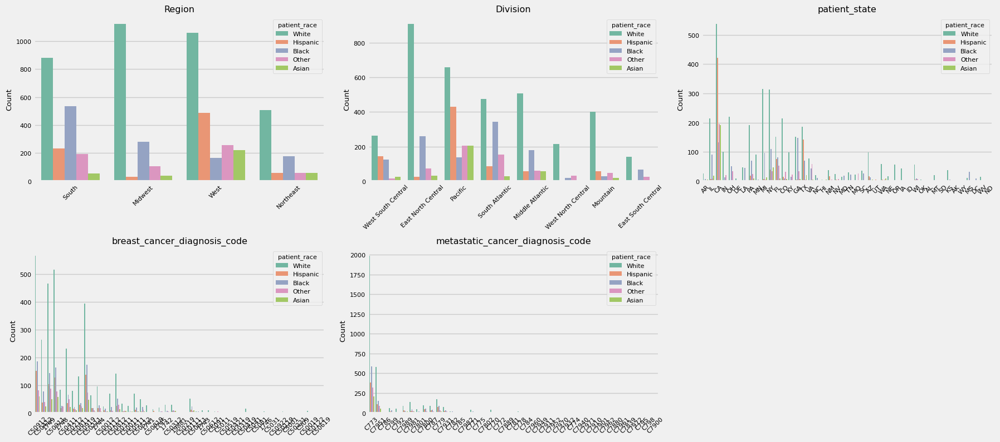

In [ ]:
print_bold(f'Distribution of Features by {TARGET}')
plot_features(features[:-1], plot_type='count', hue='patient_race', palette='Set2')

When comparing education levels by **metastatic_diagnosis_period** and distinguishing between high and low diagnosis periods, no significant differences are observed in the proportions across various education levels.

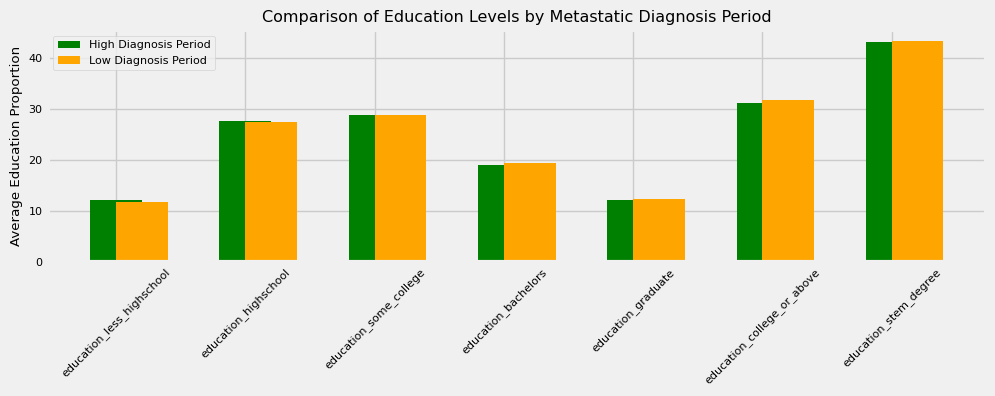

In [ ]:
# Compare the education levels of patients based on their metastatic diagnosis period
threshold = train_analysis[TARGET].median()  # %50 quantile

education_features = [col for col in num_features if col.startswith('education')]
plot_features(education_features,
              plot_type='comparison_num',
              xlabel='Education',
              title='Comparison of Education Levels by Metastatic Diagnosis Period',
              figsize_org=(10,4),
              threshold=threshold, colors=('green', 'orange'))

The White race group maintains the highest proportion in both high and low metastatic diagnosis periods, with minimal variation between the two. The Black race group also shows a notable presence, though at a significantly lower level, with similarly minor differences between high and low diagnosis periods. Other groups, including Asian, Native, and Other categories, make up a much smaller proportion, showing little to no variation between the diagnosis periods.

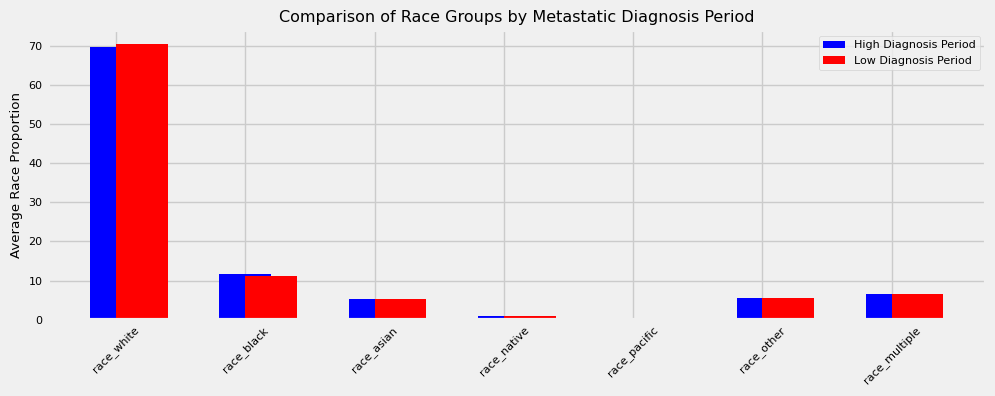

In [ ]:
# Relationship between patients' race and the period of their metastatic diagnosis
race_features = [col for col in num_features if col.startswith('race')]

plot_features(race_features,
              plot_type='comparison_num',
              xlabel='Race',
              title='Comparison of Race Groups by Metastatic Diagnosis Period',
              figsize_org=(10,4),
              threshold=threshold, colors = ('blue', 'red')) # 'blue', 'orange', 'red', 'green'

The following chart shows that higher-income groups, especially those with household incomes of \$150k and above, have a larger proportion of cases during both high and low metastatic diagnosis periods. In contrast, lower-income groups, particularly those earning under \$25k, have a much smaller proportion. Overall, the wealthier groups dominate the diagnosis proportions.

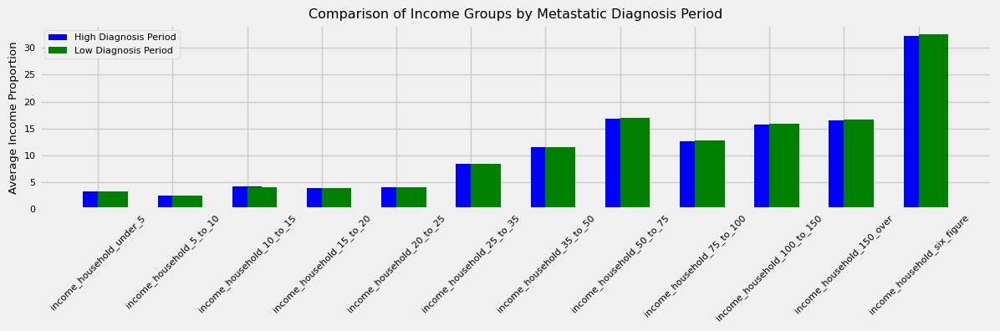

In [ ]:
# Relationship between income groups and the period of metastatic diagnosis
income_features = [col for col in num_features if col.startswith('income')][1:-1]

plot_features(income_features,
              plot_type='comparison_num',
              xlabel='Income',
              title='Comparison of Income Groups by Metastatic Diagnosis Period',
              figsize_org=(12,4),
              threshold=threshold, colors = ('blue', 'green'))

When comparing age group proportions by metastatic_diagnosis_period, most age groups show similar distributions, with only minor differences observed. Across the younger groups, such as those under 10 and between 10 to 19, the proportions are nearly identical. The biggest differences are in the older groups, with slightly more high diagnosis periods in the 70s and more low diagnosis periods in the over-80 group, though overall differences remain minimal.

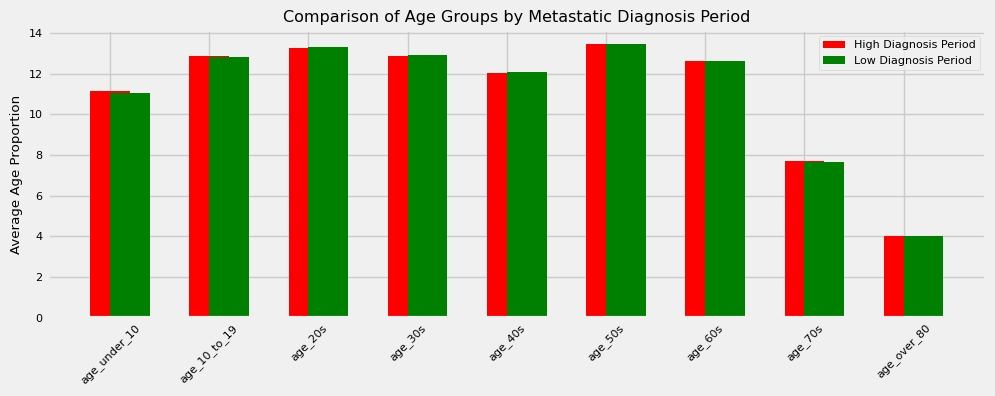

In [ ]:
# Relationship between patients' age group and the period of their metastatic diagnosis
age_features = [col for col in num_features if col.startswith('age')][1:]

plot_features(age_features,
              plot_type='comparison_num',
              xlabel='Age',
              title='Comparison of Age Groups by Metastatic Diagnosis Period',
              figsize_org=(10,4),
              threshold=threshold, colors = ('red', 'green'))

Comparing the proportions of different payer types shows that the Commercial payer type has a higher proportion during the high diagnosis period compared to the low diagnosis period. For Medicaid and Medicare Advantage, the proportions appear to be relatively stable between the two periods, with only minor differences.

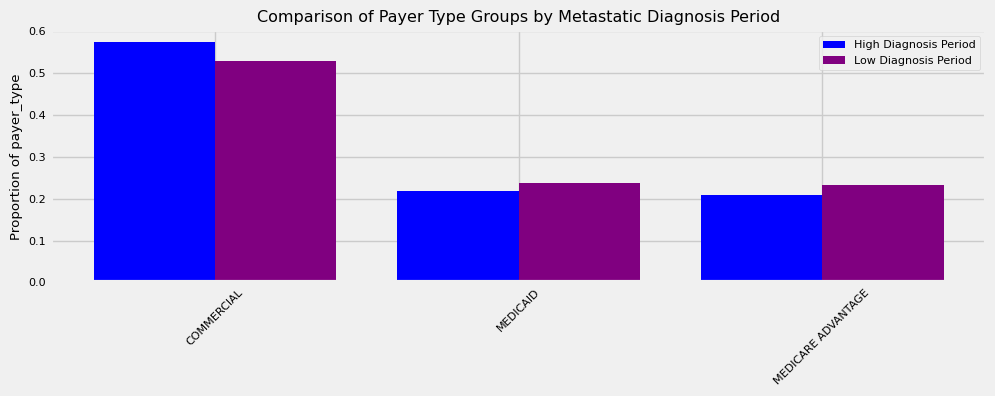

In [ ]:
# Relationship between payer_type and metastatic_diagnosis_period
plot_features(['payer_type'],
              plot_type='comparison_cat',
              xlabel='Payer Type',
              title='Comparison of Payer Type Groups by Metastatic Diagnosis Period',
              figsize_org=(10,4),
              threshold=threshold, colors = ('blue', 'purple')) # 'blue', 'orange', 'red', 'green'

Valuable insights are provided into patient demographics and the socioeconomic conditions of the regions where patients reside, aiding in the identification and interpretation of differences between these areas. By examining the distribution of patient age, BMI, education levels, and income brackets across **metastatic_diagnosis_period**, a clearer understanding is developed of how individual health factors interact with broader socioeconomic factors. These visualizations highlight the variability within specific groups, offering a clearer view of potential disparities in socioeconomic status across different regions.

The **patient_age** remains fairly stable across all groups, with an average around 60 years. In the Low group, however, a wide error bar indicates the presence of both younger and older patients. For bmi, the average hovers around 30, but broader error bars in the Low and Medium-High groups suggest greater variability.

In terms of **education_stem_degree**, the proportion remains steady at around 44%, showing little change across different metastatic diagnosis periods. However, a wider error bar is observed in the Low group, indicating higher variability in STEM education levels.

For **income_household_under_5**, the average is about 3.5%, but significantly broader error bars in the Low and High groups reflect greater income variation in these periods. Lastly, **income_household_35_to_50** averages around 12%, with minimal differences between groups and small error bars, indicating limited variability.

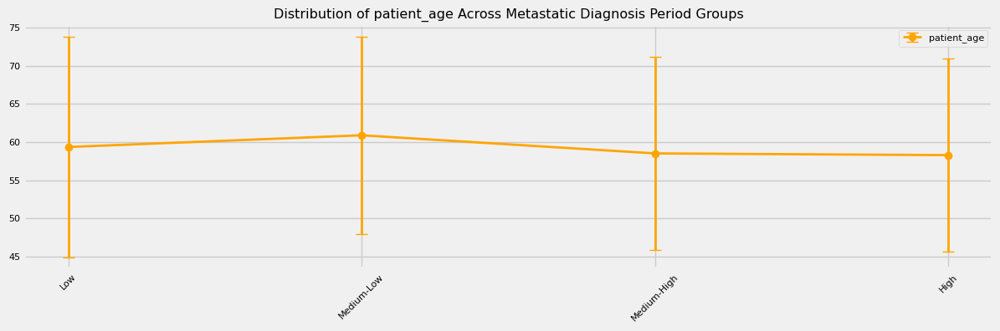

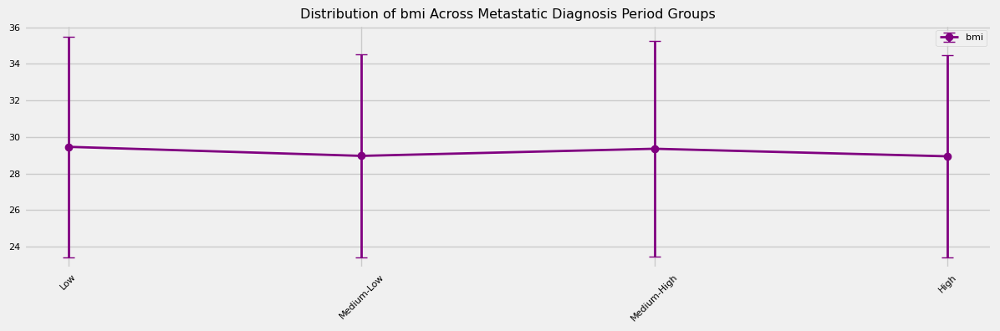

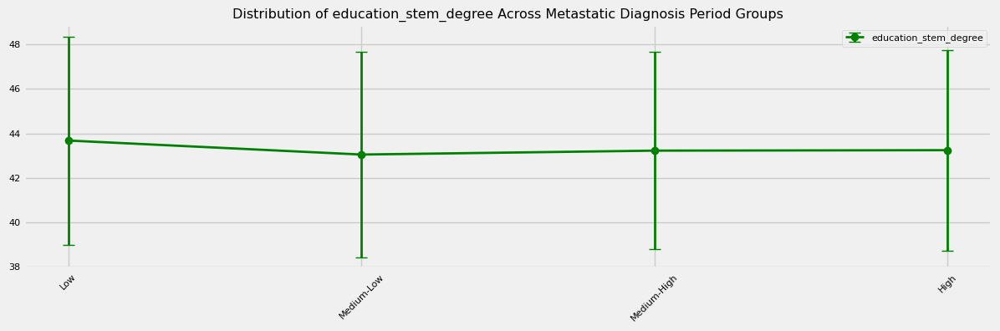

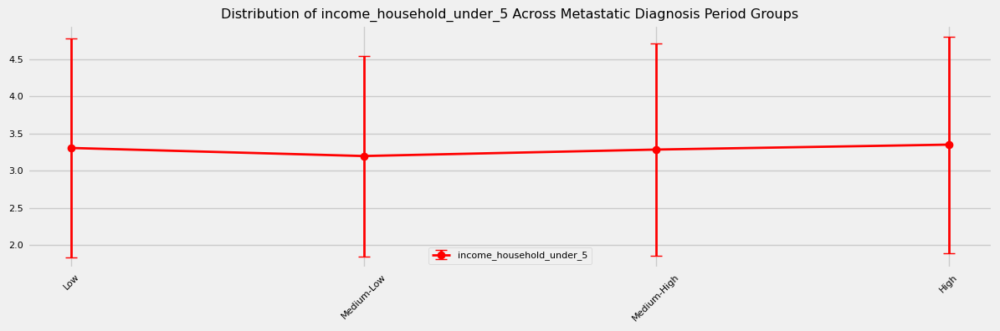

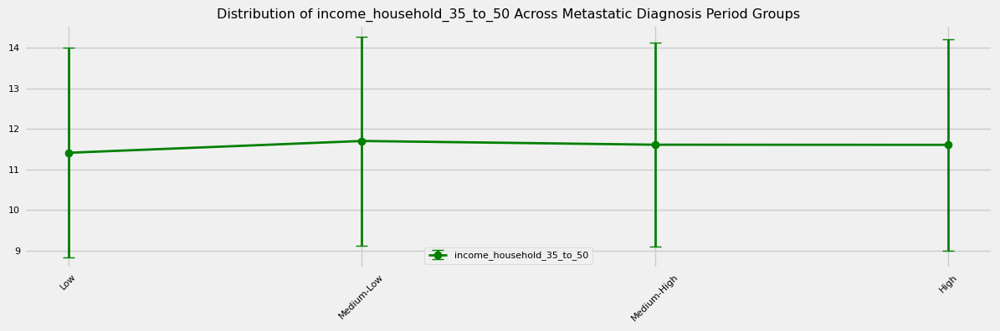

In [ ]:
# Bining into four equal-sized quantile groups
train_analysis['diagnosis_group'] = pd.qcut(train_analysis['metastatic_diagnosis_period'], q=4, labels=['Low', 'Medium-Low', 'Medium-High', 'High'])

def trend_analysis(feature, color):
    # Compute mean and standard deviation
    grouped_data_mean = train_analysis.groupby('diagnosis_group')[[feature[0]]].mean()
    grouped_data_std = train_analysis.groupby('diagnosis_group')[[feature[0]]].std()

    title = f'Distribution of {feature[0]} Across Metastatic Diagnosis Period Groups'
    plot_features(feature, data=grouped_data_mean, plot_type='errorbar', title=title, figsize_org=(6, 4), data_std=grouped_data_std, label=feature[0], color=color, capsize=5, linestyle='-', linewidth=2)

trend_features_color = {'patient_age':'orange', 'bmi':'purple',
                        'education_stem_degree': 'green',
                        'income_household_under_5': 'red',
                        'income_household_35_to_50': 'green'}

for feature, color in trend_features_color.items():
    trend_analysis([feature], color)


- **Correlation Analysis**

When examining the correlation values between **metastatic_diagnosis_period** and **temperature features**, all correlations range between -0.015 and 0.029, indicating very weak relationships.

In [ ]:
corr = train_analysis[[feat for feat in num_features if feat.startswith('Average')] + [TARGET]].corr()
corr.tail(1)

,Average of Jan-13,Average of Feb-13,Average of Mar-13,Average of Apr-13,Average of May-13,Average of Jun-13,Average of Jul-13,Average of Aug-13,Average of Sep-13,Average of Oct-13,Average of Nov-13,Average of Dec-13,Average of Jan-14,Average of Feb-14,Average of Mar-14,Average of Apr-14,Average of May-14,Average of Jun-14,Average of Jul-14,Average of Aug-14,Average of Sep-14,Average of Oct-14,Average of Nov-14,Average of Dec-14,Average of Jan-15,Average of Feb-15,Average of Mar-15,Average of Apr-15,Average of May-15,Average of Jun-15,Average of Jul-15,Average of Aug-15,Average of Sep-15,Average of Oct-15,Average of Nov-15,Average of Dec-15,Average of Jan-16,Average of Feb-16,Average of Mar-16,Average of Apr-16,Average of May-16,Average of Jun-16,Average of Jul-16,Average of Aug-16,Average of Sep-16,Average of Oct-16,Average of Nov-16,Average of Dec-16,Average of Jan-17,Average of Feb-17,Average of Mar-17,Average of Apr-17,Average of May-17,Average of Jun-17,Average of Jul-17,Average of Aug-17,Average of Sep-17,Average of Oct-17,Average of Nov-17,Average of Dec-17,Average of Jan-18,Average of Feb-18,Average of Mar-18,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18,metastatic_diagnosis_period
metastatic_diagnosis_period,-0.009,-0.009,-0.005,0.007,0.008,0.014,0.024,0.004,-0.002,0.005,-0.009,-0.006,-0.015,-0.008,-0.011,-0.000,0.009,0.021,0.013,0.006,0.002,-0.006,-0.006,-0.003,-0.016,-0.015,-0.014,-0.001,0.029,0.012,0.014,0.009,0.004,-0.008,0.001,0.005,-0.012,-0.013,0.000,-0.001,0.015,0.012,0.018,0.025,0.011,-0.002,-0.009,-0.003,-0.003,-0.007,-0.012,0.011,0.011,0.015,0.012,0.013,0.010,0.007,-0.008,-0.012,-0.015,0.001,-0.009,-0.002,0.015,0.008,0.011,0.020,0.014,0.003,-0.007,-0.007,1.000


When examining the relationships between some temperature features and the metastatic_diagnosis_period, no significant trends or linear correlations are observed.

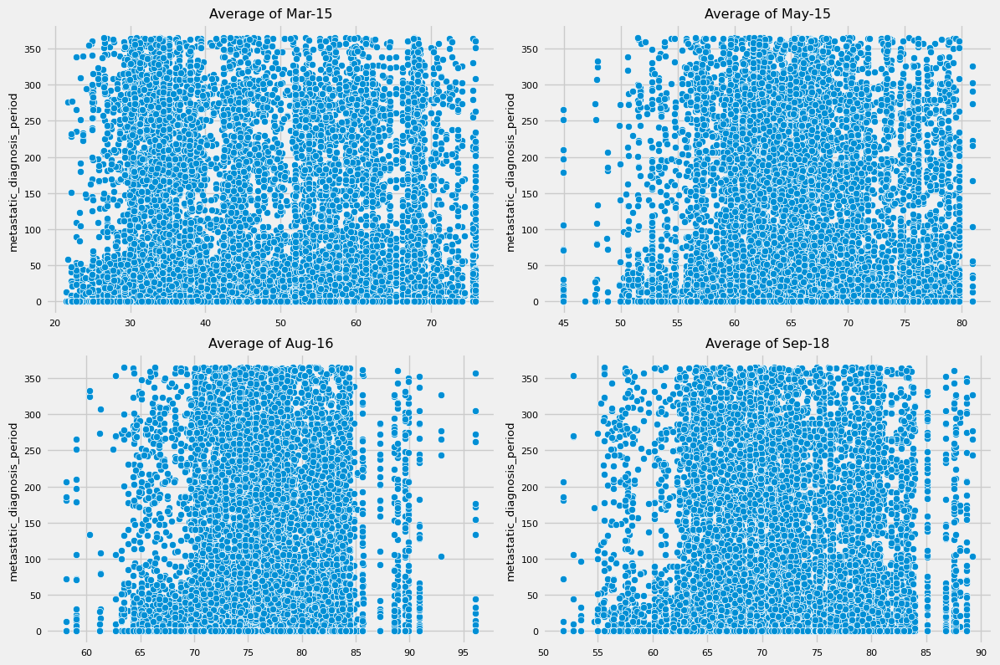

In [ ]:
plot_features(['Average of Mar-15', 'Average of May-15', 'Average of Aug-16', 'Average of Sep-18'], plot_type='scatter', target=TARGET)

When examining the correlation between **metastatic_diagnosis_period** and **numerical features** (excluding temperature-related attributes), most relationships are weak, as the correlation values are close to 0, indicating very small positive or negative relationships. However, it would be useful to identify the features with the strongest relationships and visualize their distribution in relation to the metastatic_diagnosis_period. This way, it can be assessed whether there is a linear relationship between the strongest correlated features and the target variable.

In [ ]:
num_features_corr = [feat for feat in num_features if not feat.startswith('Average')]
num_features_corr.remove('patient_zip3')
corr = train_analysis[num_features_corr].corr()
corr.tail(1)

,patient_age,bmi,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,metastatic_diagnosis_period
metastatic_diagnosis_period,-0.055,-0.019,0.010,0.026,0.005,0.011,0.014,-0.013,-0.021,-0.024,0.002,0.010,0.017,0.012,-0.005,0.005,-0.011,0.005,0.003,0.029,0.027,-0.036,-0.022,0.027,0.026,0.032,0.028,0.021,0.020,0.014,-0.005,-0.027,-0.024,-0.015,-0.019,-0.025,-0.000,0.008,-0.014,-0.019,-0.000,0.027,0.020,0.006,-0.034,-0.019,-0.028,-0.016,-0.039,0.025,-0.021,0.001,-0.021,0.025,0.003,0.003,0.002,0.011,-0.007,0.004,0.021,0.029,0.007,0.019,0.001,0.000,1.000


The scatter plots of various features—those with the highest correlation values in the correlation matrix—against the **metastatic_diagnosis_period** show no strong or clear linear patterns. Grouping certain features may provide a more meaningful approach to understanding their relationship with metastatic_diagnosis_period.

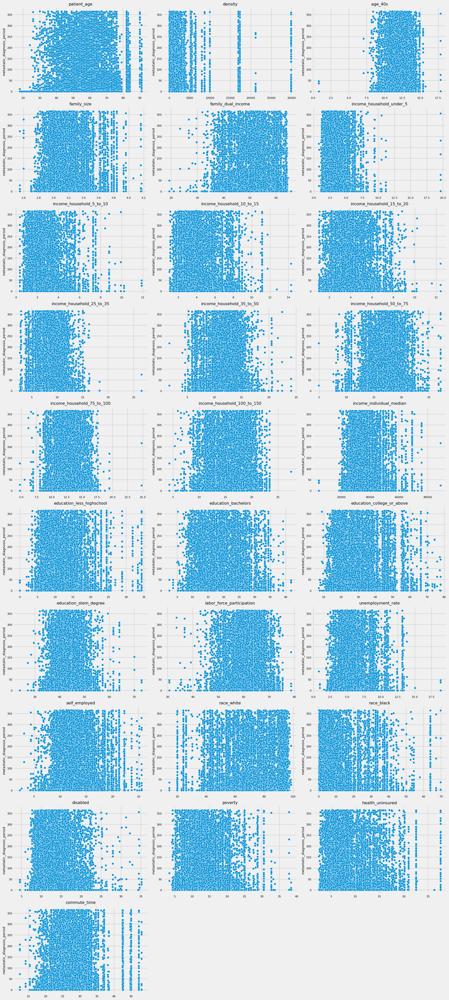

In [ ]:
rel_features = [
    'patient_age',
    'density',
    'age_40s',
    'family_size',
    'family_dual_income',
    'income_household_under_5',
    'income_household_5_to_10',
    'income_household_10_to_15',
    'income_household_15_to_20',
    'income_household_25_to_35',
    'income_household_35_to_50',
    'income_household_50_to_75',
    'income_household_75_to_100',
    'income_household_100_to_150',
    'income_individual_median',
    'education_less_highschool',
    'education_bachelors',
    'education_college_or_above',
    'education_stem_degree',
    'labor_force_participation',
    'unemployment_rate',
    'self_employed',
    'race_white',
    'race_black',
    'disabled',
    'poverty',
    'health_uninsured',
    'commute_time']
plot_features(rel_features, plot_type='scatter', target=TARGET)

To make the features more meaningful, **K-Means** clustering is used to group them. The **WCSS (Within-Cluster Sum of Squares)** measures the internal variance between clusters and indicates that clusters should be tighter and more distinct. When the WCSS values for each feature are visualized, different elbow points may become apparent. To avoid errors and determine the optimal k value, the rate of change in the WCSS values is measured, and the k value with the highest rate of change is selected.

In [ ]:
def Find_K_with_elbow(df, start=2, end=10, vis=True):
    wcss_values = []
    for i in range(start, end):
        kmeans = KMeans(n_clusters=i, init='k-means++', random_state=seed, n_init="auto")
        kmeans.fit(df)
        wcss_values.append(kmeans.inertia_)  # WCSS values

    # Calculate WCSS differences
    wcss_diff = np.diff(wcss_values)  # 1st degree differences
    wcss_diff_abs = np.abs(wcss_diff)  # Absolute value of differences

    # Elbow point:
    elbow_point = np.argmax(wcss_diff_abs) + 1 + start  # Largest absolute difference

    if vis:
        plt.figure(figsize=(6, 4))
        plt.plot(range(start, end), wcss_values, marker='o', linestyle='--', color='blue', label='WCSS')
        plt.axvline(x=elbow_point, color='red', linestyle='--', label='Elbow Point')
        plt.xlabel("Number of Clusters")
        plt.ylabel("WCSS (Within-Cluster Sum of Squares)")
        plt.title("WCSS vs. Number of Clusters (Elbow Method)")
        plt.legend()
        plt.show()

    return elbow_point, wcss_values[elbow_point - start]

K-Means Analysis for patient_age

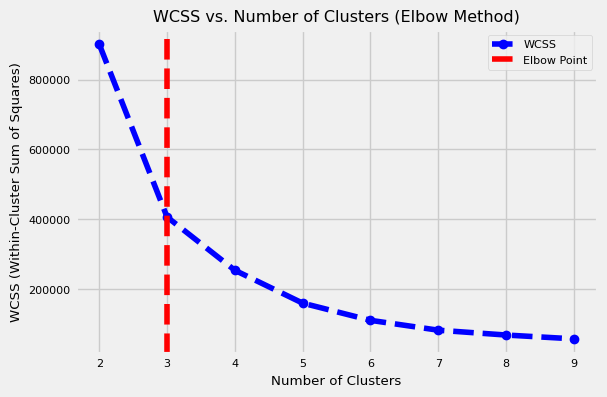

Elbow Point: 3
K-Means Analysis for density

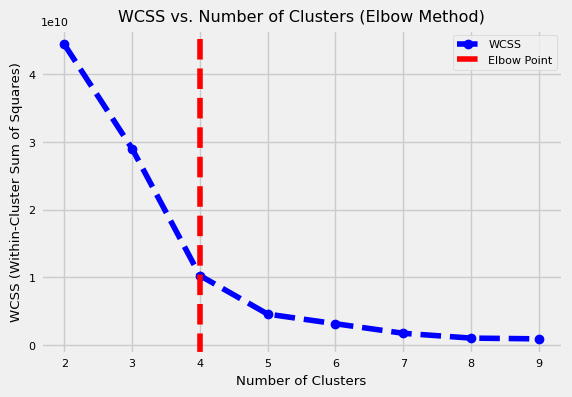

Elbow Point: 4
K-Means Analysis for unemployment_rate

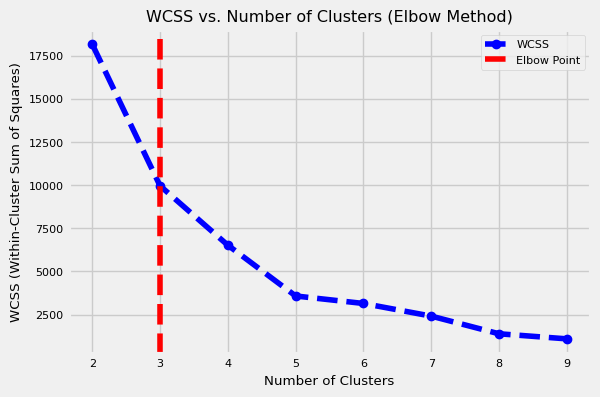

Elbow Point: 3
K-Means Analysis for commute_time

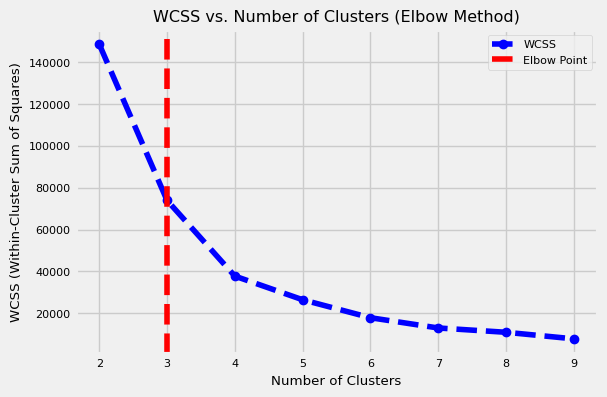

Elbow Point: 3


In [ ]:
group_features = [
    {'feature': 'patient_age', 'n_cluster': 0},
    {'feature': 'density', 'n_cluster': 0},
    {'feature': 'unemployment_rate', 'n_cluster': 0},
    {'feature': 'commute_time', 'n_cluster': 0}]

for group in group_features:
    feature = group['feature']
    print_bold(f'K-Means Analysis for {feature}')

    elbow_point, min_wcss_at_elbow = Find_K_with_elbow(train_analysis[[feature]])

    group['n_cluster'] = elbow_point
    print(f"Elbow Point: {elbow_point}")
    # print(f"Minimum WCSS at Elbow: {min_wcss_at_elbow}")


Two metrics, the Silhouette Score and the Davies-Bouldin Index, have been used to evaluate the quality of the clustering model.

**Silhouette Score**

- Range: -1 to 1

  - 1: Indicates a clear separation between clusters, with each sample fitting well within its own cluster.
  - 0: Implies that there is no distinct separation between clusters, meaning the boundaries between clusters are ambiguous.
  - -1: Suggests that the data points seem to have been assigned to incorrect clusters, with samples being closer to clusters other than their own.

**Davies-Bouldin Index**

- Range: 0 to ∞

  - Lower values: Indicate better clustering quality.
  - Higher values: Suggest that the distance between clusters is low, and the clusters are closer together, indicating poorer clustering quality.

In [ ]:
def feature_groups_function(train, test=None, feature='patient_age', n_clusters=3, vis=False):
    train_data = train.copy()
    test_data = test.copy() if test is not None else None

    # New column for the group
    group_feature = f'{feature}_group'
    print_bold(f'K-Means Groups for {feature} w n_clusters: {n_clusters}:\n')

    # Model
    kmeans = KMeans(n_clusters=n_clusters, random_state=seed)
    train_data[group_feature] = kmeans.fit_predict(train_data[[feature]])

    # Davies-Bouldin score
    dbi = davies_bouldin_score(train_data[[feature]], kmeans.labels_)
    # Silhouette score
    score = silhouette_score(train_data[[feature]], kmeans.labels_)
    print(f"Silhouette Score: {score}")
    print(f"Davies-Bouldin Index: {dbi}\n")

    if test_data is not None:
        test_data[group_feature] = kmeans.predict(test_data[[feature]])

    if vis:
        plot_features(np.arange(n_clusters), data=train_data, plot_type='groups', target=feature, xlabel='', ylabel='', group_feature=group_feature)

    return train_data, test_data


When features are clustered based on the calculated k values, different results are obtained. Density demonstrates the best clustering with a high **Silhouette Score** (0.7835) and a low **Davies-Bouldin Index** (0.2853), indicating well-separated and compact clusters. On the other hand, unemployment_rate, commute_time, and patient_age exhibit moderate clustering performance, with Silhouette Scores around 0.54-0.57, which suggests some overlap between clusters. The Davies-Bouldin Index values also indicate less distinct separation in these cases.

K-Means Groups for patient_age w n_clusters: 3:
Silhouette Score: 0.5579967375904437
Davies-Bouldin Index: 0.5447271570480577



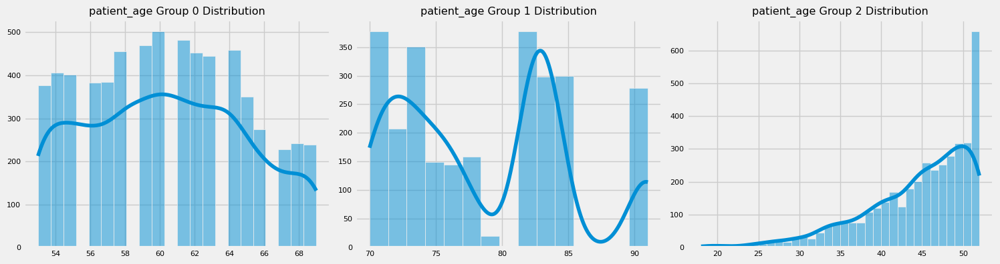

K-Means Groups for density w n_clusters: 4:
Silhouette Score: 0.7834790058331899
Davies-Bouldin Index: 0.2853218366192737

K-Means Groups for unemployment_rate w n_clusters: 3:
Silhouette Score: 0.5438749206808348
Davies-Bouldin Index: 0.5780440983840439

K-Means Groups for commute_time w n_clusters: 3:
Silhouette Score: 0.5709556664563802
Davies-Bouldin Index: 0.4787134871328835



In [ ]:
for i, group in enumerate(group_features):
    feature = group['feature']
    n_cluster = group['n_cluster']

    vis = False
    if i == 0:
        vis=True
    train_analysis, _ = feature_groups_function(train_analysis, feature=feature, n_clusters=n_cluster, vis=vis)

An **ANOVA** (analysis of variance) test was applied to understand whether the effects of categorical features on the target variable, **metastatic_diagnosis_period**, are linear. Features with high **F-statistic** and low **p-value**, such as breast_cancer_diagnosis_code and breast_cancer_diagnosis_desc, show a strong relationship with metastatic_diagnosis_period. On the other hand, metastatic_first_novel_treatment does not have a statistically significant effect on metastatic_diagnosis_period. Other features, however, do exhibit a significant relationship with the target variable.

In [ ]:
# Perform an ANOVA test for categorical features with target feature
def anova_func(features, df=train_analysis, target=TARGET):
    anova_results = []
    # Remove rows containing NaN in target column if exists
    df_clean = df.dropna(subset=[target])
    print_bold(f"ANOVA test for {target}:\n")

    for feature in features:
        if df_clean.groupby(feature).ngroups > 1:
            f_statistic, p_value = stats.f_oneway(*[group[target] for name, group in df_clean.groupby(feature)])

            anova_results.append({
                'Feature': feature,
                'F-statistic': f_statistic,
                'p-value': p_value
            })
    results_df = pd.DataFrame(anova_results)
    return results_df

anova_results = anova_func(cat_features)
anova_results

ANOVA test for metastatic_diagnosis_period:


,Feature,F-statistic,p-value
0,patient_race,3.314,0.010
1,payer_type,6.166,0.002
2,patient_state,2.921,0.000
3,Region,4.696,0.003
4,Division,2.823,0.006
5,breast_cancer_diagnosis_code,206.134,0.000
6,metastatic_cancer_diagnosis_code,4.731,0.000
7,metastatic_first_novel_treatment,0.341,0.574


- **Quantile Analysis**

Grouping data by both **breast_cancer_diagnosis_code** and **metastatic_cancer_diagnosis_code**, followed by analyzing the quantiles of the **metastatic_diagnosis_period**, can reveal patterns or disparities in the progression and outcomes of the disease.

The following table reflects a variation in how long it takes for different breast cancer diagnoses to progress to metastatic cancer, with some diagnoses experiencing a much quicker progression than others.

In [ ]:
train_analysis.groupby('breast_cancer_diagnosis_code')[TARGET].quantile([0.25, 0.5, 0.75]).unstack().sort_values(by=0.75, ascending=False)[:15]

,0.250,0.500,0.750
breast_cancer_diagnosis_code,,,
1746,251.000,286.000,303.000
1745,165.000,228.000,293.000
1748,173.000,238.000,290.000
1749,169.000,252.000,290.000
1742,152.000,231.500,289.500
1741,153.500,246.500,287.500
1744,168.000,246.000,281.000
19881,101.500,261.000,273.000
1743,130.000,197.000,264.000


The following table suggests that variations across different codes indicate that the time to metastasis may vary significantly depending on the specific metastatic diagnosis code, reflecting differences in disease progression or response to treatment.


In [ ]:
train_analysis.groupby('metastatic_cancer_diagnosis_code')[TARGET].quantile([0.25, 0.5, 0.75]).unstack().sort_values(by=0.5, ascending=False)[:12]

,0.250,0.500,0.750
metastatic_cancer_diagnosis_code,,,
C7932,3.000,248.000,304.000
C7901,123.750,199.500,275.250
C784,23.750,175.500,264.250
C7962,165.000,165.000,165.000
C7911,87.000,151.000,215.000
C795,75.000,150.000,225.000
C774,86.500,123.000,128.000
C7981,21.000,85.000,225.000
C779,10.000,83.000,248.250


# **`4.` Data Cleaning**
<a name="data_cleaning"></a>

## **`1.` Inconsistent Data**
<a name="inconsisten_data"></a>

In [ ]:
# Combine train and test
test_raw[TARGET] = -1

drop_col = ['patient_gender']
# drop_col = []
train = train_raw.drop(drop_col, axis=1)
test = test_raw.drop(drop_col, axis=1)

data = pd.concat([train, test], axis=0, ignore_index=True)
data['source'] = np.where(data[TARGET] == -1, 'test', 'train')


+ **breast_cancer_diagnosis_code/desc**

It is established that the **breast_cancer_diagnosis_code** and **breast_cancer_diagnosis_desc** values are interrelated. Therefore, it is necessary to conduct a line-by-line examination of the dataset to analyze this relationship in detail.
This analysis should focus on identifying patterns, such as whether certain diagnosis codes are consistently paired with specific descriptions or if any codes exhibit ambiguous or multiple descriptions.

In [ ]:
data.groupby(['breast_cancer_diagnosis_code', 'breast_cancer_diagnosis_desc'], as_index=False)['patient_id'].count()

,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,patient_id
0,1741,Malignant neoplasm of central portion of femal...,133
1,1742,Malignant neoplasm of upper-inner quadrant of ...,147
2,1743,Malignant neoplasm of lower-inner quadrant of ...,69
3,1744,Malignant neoplasm of upper-outer quadrant of ...,588
4,1745,Malignant neoplasm of lower-outer quadrant of ...,108
5,1746,Malignant neoplasm of axillary tail of female ...,15
6,1748,Malignant neoplasm of other specified sites of...,481
7,1749,"Malignant neoplasm of breast (female), unspeci...",2828
8,19881,Secondary malignant neoplasm of breast,19
9,C5001,"Malignant neoplasm of nipple and areola, female",1


To rectify the corrupted values, the following pages are referenced: [ICD-9 Data](http://www.icd9data.com/2012/Volume1/140-239/170-176/174/default.htm) and [ICD-10 Data](https://www.icd10data.com/ICD10CM/Codes/C00-D49/C50-C50/C50-).

In [ ]:
# Fix Corrupted Values
cancer_feats = ['breast_cancer_diagnosis_code', 'breast_cancer_diagnosis_desc', 'metastatic_cancer_diagnosis_code']

code_desc_replacement = {'C50122': 'C50112', 'C50221': 'C50211', 'C50421': 'C50411', 'C509': 'C5091', 'C50922': 'C50912'}

for old_code, new_code in code_desc_replacement.items():
    if old_code != 'C50122' and old_code != 'C50922' and old_code != '19881':
        if not data.loc[data[cancer_feats[0]] == new_code, cancer_feats[1]].empty:
            desired_desc = data.loc[data[cancer_feats[0]].str.strip() == new_code, cancer_feats[1]].values[0]
            data.loc[data[cancer_feats[0]] == old_code, cancer_feats[1]] = desired_desc

data[cancer_feats[0]] = data[cancer_feats[0]].replace(code_desc_replacement)
# data.groupby(['breast_cancer_diagnosis_code', 'breast_cancer_diagnosis_desc'], as_index=False)['patient_id'].count()

In [ ]:
data.breast_cancer_diagnosis_code.nunique(), data.breast_cancer_diagnosis_desc.nunique()

(43, 45)

+ **patient_state**

There is a a summary of unique combinations of patient_zip3, patient_state, and source from the dataset. The first row shows that ZIP code **630** in the train set corresponds to 2 different states. Similarly, ZIP code **864** in the train set is also associated with 2 states.

In [ ]:
data[['patient_zip3', 'patient_state', 'source']].drop_duplicates().groupby(['source', 'patient_zip3'], as_index=False)['patient_state']. \
    count().sort_values('patient_state', ascending=False).reset_index(drop=True).head()

,source,patient_zip3,patient_state
0,train,630,2
1,train,864,2
2,test,100,1
3,train,404,1
4,train,412,1


To verify these associations between the patient_zip3 values you can access the ZIP code prefix data on [Wikipedia](https://en.wikipedia.org/wiki/List_of_ZIP_Code_prefixes#Starts_with_9).

In [ ]:
data.loc[data.patient_zip3.isin([630, 864]), ['patient_state','patient_zip3']].drop_duplicates()

,patient_state,patient_zip3
475,MO,630
2221,IL,630
5299,AZ,864
9229,CA,864


To ensure the accuracy of state associations in the dataset, the patient_state column was reviewed by cross-referencing ZIP codes with relevant data, including population figures.

In [ ]:
data[data['patient_zip3'] == 630][['patient_state', 'patient_zip3', 'population']].head(7)

,patient_state,patient_zip3,population
475,MO,630,12912.190
596,MO,630,12912.190
764,MO,630,12912.190
869,MO,630,12912.190
1221,MO,630,12912.190
1769,MO,630,12912.190
2221,IL,630,12912.190


In [ ]:
data[data['patient_zip3'] == 864][['patient_state', 'patient_zip3', 'population']]

,patient_state,patient_zip3,population
5299,AZ,864,8967.220
9229,CA,864,8967.220
11243,AZ,864,8967.220
11584,AZ,864,8967.220
12760,AZ,864,8967.220
14358,AZ,864,8967.220


Discrepancies were identified and corrected using verified sources, ensuring consistency and accuracy in the patient location information across the dataset.

In [ ]:
data['patient_state'] = np.where(data['patient_zip3'] == 630, 'MO', np.where(data['patient_zip3'] == 864, 'AZ', data['patient_state']))

+ **Division**

A check was performed to identify inconsistencies where multiple **Division** values were assigned to the same combination of patient_state and patient_zip3 due to the previous correction causing a change in the data.

In [ ]:
division_group = data[['patient_state', 'patient_zip3', 'Division', 'source']].drop_duplicates().groupby(['source', 'patient_zip3', 'patient_state'], as_index=False)['Division']. \
    count().sort_values('Division', ascending=False).reset_index(drop=True)
division_group[division_group['Division'] > 1]

,source,patient_zip3,patient_state,Division
0,train,630,MO,2


In [ ]:
data.loc[data.patient_state == 'MO', 'Division'].value_counts()

,count
Division,
West North Central,243
East North Central,1


In [ ]:
data['Division'] = np.where(data['patient_state'] == 'MO', 'West North Central', data['Division'])

The process ensured that the Division values correspond correctly to the updated patient_state values.

In [ ]:
data.loc[data.patient_state == 'MO', 'Division'].value_counts()

,count
Division,
West North Central,244


+ **Demographic and Socio-Economic Features**

The following features pertain to geographic information. It is essential to ensure consistency in the patient_zip3 data reference across the dataset.

In [ ]:
# Selecting Relevant Columns
demo_socio_cols = ['patient_zip3', 'patient_state'] + data.loc[:, 'population':'Average of Dec-18'].columns.to_list()

# Removing Duplicates
df_pop = data[demo_socio_cols].drop_duplicates().sort_values('patient_zip3')

df_pop_temp = df_pop.groupby('patient_zip3').size().reset_index(name='count')
df_pop_temp[df_pop_temp['count'] > 1]

,patient_zip3,count
272,395,2
737,968,2
754,988,2


In [ ]:
duplicate_zip3 = df_pop_temp[df_pop_temp['count'] > 1]['patient_zip3']
df_duplicates = df_pop[df_pop['patient_zip3'].isin(duplicate_zip3)]
df_duplicates

,patient_zip3,patient_state,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Average of Jan-13,Average of Feb-13,Average of Mar-13,Average of Apr-13,Average of May-13,Average of Jun-13,Average of Jul-13,Average of Aug-13,Average of Sep-13,Average of Oct-13,Average of Nov-13,Average of Dec-13,Average of Jan-14,Average of Feb-14,Average of Mar-14,Average of Apr-14,Average of May-14,Average of Jun-14,Average of Jul-14,Average of Aug-14,Average of Sep-14,Average of Oct-14,Average of Nov-14,Average of Dec-14,Average of Jan-15,Average of Feb-15,Average of Mar-15,Average of Apr-15,Average of May-15,Average of Jun-15,Average of Jul-15,Average of Aug-15,Average of Sep-15,Average of Oct-15,Average of Nov-15,Average of Dec-15,Average of Jan-16,Average of Feb-16,Average of Mar-16,Average of Apr-16,Average of May-16,Average of Jun-16,Average of Jul-16,Average of Aug-16,Average of Sep-16,Average of Oct-16,Average of Nov-16,Average of Dec-16,Average of Jan-17,Average of Feb-17,Average of Mar-17,Average of Apr-17,Average of May-17,Average of Jun-17,Average of Jul-17,Average of Aug-17,Average of Sep-17,Average of Oct-17,Average of Nov-17,Average of Dec-17,Average of Jan-18,Average of Feb-18,Average of Mar-18,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18
1670,395,MS,14629.180,275.450,38.940,10.930,13.810,15.540,12.690,11.600,12.710,11.510,7.940,3.230,52.560,47.440,44.200,15.830,33.720,6.250,3.130,45.520,52793.960,4.370,3.240,4.940,5.920,5.060,11.370,13.930,17.940,12.400,12.340,8.530,20.860,27431.700,69.640,5586.750,147673.800,909.610,33.350,11.760,28.010,36.470,16.430,7.340,23.760,47.310,61.840,7.790,12.440,1.160,70.640,19.790,2.870,0.430,0.080,1.770,4.410,5.810,18.900,17.480,1.320,26.690,14.480,17.600,53.670,53.100,53.210,64.300,70.570,80.080,79.090,79.740,78.660,68.750,54.950,51.440,49.940,51.140,54.570,64.680,72.060,79.440,79.570,81.480,78.240,68.760,52.110,54.560,47.510,45.890,62.920,69.820,73.960,79.450,83.670,81.310,76.930,69.830,62.140,60.150,47.140,53.280,63.320,66.810,72.220,79.960,82.680,81.910,79.630,70.320,61.150,54.760,56.660,58.670,62.420,68.040,71.080,76.890,80.420,80.060,75.760,67.960,59.330,49.910,43.730,61.680,59.280,61.280,75.900,80.940,81.470,80.090,79.680,70.250,53.830,52.290
2414,395,MS,10492.250,90.650,39.060,12.290,14.070,14.180,11.760,11.300,12.180,12.720,7.690,3.830,48.950,51.050,48.770,13.150,30.010,8.090,3.280,42.890,47510.590,3.790,4.570,6.860,6.270,7.350,10.230,12.870,17.650,10.010,13.280,7.090,20.380,24684.060,79.940,3853.720,118231.800,742.130,35.810,14.030,33.790,34.190,11.380,6.600,17.980,36.350,53.780,6.270,14.110,6.830,73.860,22.840,0.510,0.230,0.080,0.690,1.780,3.140,19.670,18.210,0.420,29.830,13.220,7.310,53.670,53.100,53.210,64.300,70.570,80.080,79.090,79.740,78.660,68.750,54.950,51.440,49.940,51.140,54.570,64.680,72.060,79.440,79.570,81.480,78.240,68.760,52.110,54.560,47.510,45.890,62.920,69.820,73.960,79.450,83.670,81.310,76.930,69.830,62.140,60.

In [ ]:
data[data.patient_zip3==395][['patient_id'] + demo_socio_cols].head(3)

,patient_id,patient_zip3,patient_state,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Average of Jan-13,Average of Feb-13,Average of Mar-13,Average of Apr-13,Average of May-13,Average of Jun-13,Average of Jul-13,Average of Aug-13,Average of Sep-13,Average of Oct-13,Average of Nov-13,Average of Dec-13,Average of Jan-14,Average of Feb-14,Average of Mar-14,Average of Apr-14,Average of May-14,Average of Jun-14,Average of Jul-14,Average of Aug-14,Average of Sep-14,Average of Oct-14,Average of Nov-14,Average of Dec-14,Average of Jan-15,Average of Feb-15,Average of Mar-15,Average of Apr-15,Average of May-15,Average of Jun-15,Average of Jul-15,Average of Aug-15,Average of Sep-15,Average of Oct-15,Average of Nov-15,Average of Dec-15,Average of Jan-16,Average of Feb-16,Average of Mar-16,Average of Apr-16,Average of May-16,Average of Jun-16,Average of Jul-16,Average of Aug-16,Average of Sep-16,Average of Oct-16,Average of Nov-16,Average of Dec-16,Average of Jan-17,Average of Feb-17,Average of Mar-17,Average of Apr-17,Average of May-17,Average of Jun-17,Average of Jul-17,Average of Aug-17,Average of Sep-17,Average of Oct-17,Average of Nov-17,Average of Dec-17,Average of Jan-18,Average of Feb-18,Average of Mar-18,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18
1670,636245,395,MS,14629.180,275.450,38.940,10.930,13.810,15.540,12.690,11.600,12.710,11.510,7.940,3.230,52.560,47.440,44.200,15.830,33.720,6.250,3.130,45.520,52793.960,4.370,3.240,4.940,5.920,5.060,11.370,13.930,17.940,12.400,12.340,8.530,20.860,27431.700,69.640,5586.750,147673.800,909.610,33.350,11.760,28.010,36.470,16.430,7.340,23.760,47.310,61.840,7.790,12.440,1.160,70.640,19.790,2.870,0.430,0.080,1.770,4.410,5.810,18.900,17.480,1.320,26.690,14.480,17.600,53.670,53.100,53.210,64.300,70.570,80.080,79.090,79.740,78.660,68.750,54.950,51.440,49.940,51.140,54.570,64.680,72.060,79.440,79.570,81.480,78.240,68.760,52.110,54.560,47.510,45.890,62.920,69.820,73.960,79.450,83.670,81.310,76.930,69.830,62.140,60.150,47.140,53.280,63.320,66.810,72.220,79.960,82.680,81.910,79.630,70.320,61.150,54.760,56.660,58.670,62.420,68.040,71.080,76.890,80.420,80.060,75.760,67.960,59.330,49.910,43.730,61.680,59.280,61.280,75.900,80.940,81.470,80.090,79.680,70.250,53.830,52.290
2414,714510,395,MS,10492.250,90.650,39.060,12.290,14.070,14.180,11.760,11.300,12.180,12.720,7.690,3.830,48.950,51.050,48.770,13.150,30.010,8.090,3.280,42.890,47510.590,3.790,4.570,6.860,6.270,7.350,10.230,12.870,17.650,10.010,13.280,7.090,20.380,24684.060,79.940,3853.720,118231.800,742.130,35.810,14.030,33.790,34.190,11.380,6.600,17.980,36.350,53.780,6.270,14.110,6.830,73.860,22.840,0.510,0.230,0.080,0.690,1.780,3.140,19.670,18.210,0.420,29.830,13.220,7.310,53.670,53.100,53.210,64.300,70.570,80.080,79.090,79.740,78.660,68.750,54.950,51.440,49.940,51.140,54.570,64.680,72.060,79.440,79.570,81.480,78.240,68.760,52.110,54.560,47.510,45.890,62.920,69.820,73.960,79.450,83.670,81.310

In [ ]:
data[data.patient_zip3==968][['patient_id'] + demo_socio_cols].head(3)

,patient_id,patient_zip3,patient_state,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Average of Jan-13,Average of Feb-13,Average of Mar-13,Average of Apr-13,Average of May-13,Average of Jun-13,Average of Jul-13,Average of Aug-13,Average of Sep-13,Average of Oct-13,Average of Nov-13,Average of Dec-13,Average of Jan-14,Average of Feb-14,Average of Mar-14,Average of Apr-14,Average of May-14,Average of Jun-14,Average of Jul-14,Average of Aug-14,Average of Sep-14,Average of Oct-14,Average of Nov-14,Average of Dec-14,Average of Jan-15,Average of Feb-15,Average of Mar-15,Average of Apr-15,Average of May-15,Average of Jun-15,Average of Jul-15,Average of Aug-15,Average of Sep-15,Average of Oct-15,Average of Nov-15,Average of Dec-15,Average of Jan-16,Average of Feb-16,Average of Mar-16,Average of Apr-16,Average of May-16,Average of Jun-16,Average of Jul-16,Average of Aug-16,Average of Sep-16,Average of Oct-16,Average of Nov-16,Average of Dec-16,Average of Jan-17,Average of Feb-17,Average of Mar-17,Average of Apr-17,Average of May-17,Average of Jun-17,Average of Jul-17,Average of Aug-17,Average of Sep-17,Average of Oct-17,Average of Nov-17,Average of Dec-17,Average of Jan-18,Average of Feb-18,Average of Mar-18,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18
31,271245,968,HI,21581.450,2693.960,36.280,6.110,10.990,36.900,10.540,8.520,8.750,8.440,5.560,4.160,61.600,38.400,33.070,7.680,54.980,4.280,3.240,58.060,89923.640,3.160,2.270,2.600,2.550,2.950,5.500,9.670,15.020,13.070,17.830,25.390,43.220,35935.410,53.240,7824.350,759521.600,1934.640,32.880,4.910,31.920,28.460,20.640,14.090,34.720,55.510,74.420,4.270,9.330,0.040,33.890,5.060,37.230,0.360,5.040,3.560,14.880,10.150,10.610,9.620,9.810,19.350,5.220,21.430,70.420,71.000,70.710,72.390,74.150,75.690,76.350,77.080,77.780,76.640,74.520,73.270,70.770,72.400,72.080,73.000,75.050,76.280,77.320,77.870,74.890,82.100,74.560,72.170,70.600,72.170,71.560,75.380,74.540,76.860,83.770,84.850,79.700,81.940,72.590,75.260,71.900,77.700,68.470,74.880,75.910,76.520,78.100,78.630,78.690,77.980,75.550,72.770,71.950,71.790,73.780,80.700,76.130,78.030,79.390,80.330,78.710,77.470,75.170,71.740,73.310,71.490,71.640,73.910,75.000,77.140,78.540,78.790,78.470,76.990,75.990,73.540
491,251636,968,HI,21581.450,2693.960,36.280,6.110,10.990,36.900,10.540,8.520,8.750,8.440,5.560,4.160,61.600,38.400,33.070,7.680,54.980,4.280,3.240,58.060,89923.640,3.160,2.270,2.600,2.550,2.950,5.500,9.670,15.020,13.070,17.830,25.390,43.220,35935.410,53.240,7824.350,759521.600,1934.640,32.880,4.910,31.920,28.460,20.640,14.090,34.720,55.510,74.420,4.270,9.330,0.040,33.890,5.060,37.230,0.360,5.040,3.560,14.880,10.150,10.610,9.620,9.810,19.350,5.220,21.430,70.420,71.000,70.710,72.390,74.150,75.690,76.350,77.080,77.780,76.640,74.520,73.270,70.770,72.400,72.080,73.000,75.050,76.280,77.320,77.870,74.890,82.100,74.560,72.170,70.600,72.170,71.560,75.380,74.540,76.860,83.770,84.850,79.700,81.

In [ ]:
data[data.patient_zip3==988][['patient_id'] + demo_socio_cols].head(3)

,patient_id,patient_zip3,patient_state,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Average of Jan-13,Average of Feb-13,Average of Mar-13,Average of Apr-13,Average of May-13,Average of Jun-13,Average of Jul-13,Average of Aug-13,Average of Sep-13,Average of Oct-13,Average of Nov-13,Average of Dec-13,Average of Jan-14,Average of Feb-14,Average of Mar-14,Average of Apr-14,Average of May-14,Average of Jun-14,Average of Jul-14,Average of Aug-14,Average of Sep-14,Average of Oct-14,Average of Nov-14,Average of Dec-14,Average of Jan-15,Average of Feb-15,Average of Mar-15,Average of Apr-15,Average of May-15,Average of Jun-15,Average of Jul-15,Average of Aug-15,Average of Sep-15,Average of Oct-15,Average of Nov-15,Average of Dec-15,Average of Jan-16,Average of Feb-16,Average of Mar-16,Average of Apr-16,Average of May-16,Average of Jun-16,Average of Jul-16,Average of Aug-16,Average of Sep-16,Average of Oct-16,Average of Nov-16,Average of Dec-16,Average of Jan-17,Average of Feb-17,Average of Mar-17,Average of Apr-17,Average of May-17,Average of Jun-17,Average of Jul-17,Average of Aug-17,Average of Sep-17,Average of Oct-17,Average of Nov-17,Average of Dec-17,Average of Jan-18,Average of Feb-18,Average of Mar-18,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18
422,982003,988,WA,5322.180,22.960,44.750,10.570,13.010,10.870,10.510,11.900,13.020,16.850,9.350,3.900,49.990,50.010,54.370,15.160,25.440,5.030,3.020,48.720,60952.270,1.830,2.520,4.000,3.410,4.990,12.360,12.900,21.080,13.390,14.580,8.940,23.520,29906.550,69.330,1942.420,266293.900,873.640,25.280,16.730,28.620,31.610,15.690,7.350,23.040,43.030,58.160,4.790,8.050,2.820,72.760,0.240,1.690,2.030,0.040,17.280,5.950,25.570,19.230,13.570,5.030,23.180,10.360,8.420,23.740,34.220,41.180,48.450,57.680,62.940,73.810,70.990,62.760,47.810,35.550,23.380,30.550,27.910,39.830,48.390,58.010,62.680,74.010,72.200,61.080,52.580,34.760,30.220,29.460,38.410,45.660,48.050,59.860,71.190,73.990,71.270,58.880,53.160,35.130,27.660,28.220,35.250,41.920,54.840,59.280,64.470,68.880,70.580,59.540,47.920,43.310,21.560,19.700,26.200,38.220,46.340,57.120,63.830,73.130,72.930,62.050,47.960,36.240,25.900,31.090,30.450,38.960,47.340,61.720,62.600,71.870,70.080,59.170,48.460,37.400,30.740
749,343406,988,WA,5322.180,22.960,44.750,10.570,13.010,10.870,10.510,11.900,13.020,16.850,9.350,3.900,49.990,50.010,54.370,15.160,25.440,5.030,3.020,48.720,60952.270,1.830,2.520,4.000,3.410,4.990,12.360,12.900,21.080,13.390,14.580,8.940,23.520,29906.550,69.330,1942.420,266293.900,873.640,25.280,16.730,28.620,31.610,15.690,7.350,23.040,43.030,58.160,4.790,8.050,2.820,72.760,0.240,1.690,2.030,0.040,17.280,5.950,25.570,19.230,13.570,5.030,23.180,10.360,8.420,23.740,34.220,41.180,48.450,57.680,62.940,73.810,70.990,62.760,47.810,35.550,23.380,30.550,27.910,39.830,48.390,58.010,62.680,74.010,72.200,61.080,52.580,34.760,30.220,29.460,38.410,45.660,48.050,59.860,71.190,73.990,71.270,58.88

Transferring values from one patient to another based on accurate data ensures that all relevant columns reflect the correct information.

In [ ]:
def fix_values(df, patient_id_to_fix, patient_id_correct, pop_cols):
    df.loc[df.patient_id == patient_id_to_fix, pop_cols] = df.loc[df.patient_id == patient_id_correct, pop_cols].values

fix_values(data, 714510, 636245, demo_socio_cols)  # patient_zip3==395
fix_values(data, 271422, 271245, demo_socio_cols)  # patient_zip3==968
fix_values(data, 441322, 982003, demo_socio_cols)  # patient_zip3==988

## **`2.` Missing Data**
<a name="missing"></a>

In [ ]:
# Check missing values
def missing_data(df, th=0):
    missing = df.isnull().sum()
    missing = missing[missing > th]

    missing_columns = missing[missing > 0].index.to_list()
    return  missing, missing_columns

In [ ]:
missing, missing_columns = missing_data(data, th=0)
print(missing.sort_values(ascending=False))

metastatic_first_novel_treatment         18801
metastatic_first_novel_treatment_type    18801
bmi                                      13012
patient_race                              9442
payer_type                                2550
Average of Apr-14                          275
Average of Jun-14                          231
Average of Oct-13                           86
Average of Jul-18                           62
Average of Dec-18                           56
Average of Mar-14                           46
Average of Jul-17                           44
Average of Jan-13                           42
Average of Sep-13                           41
Average of Apr-15                           38
Average of Aug-15                           37
Average of Oct-17                           36
Average of Nov-14                           33
Average of Jun-13                           27
Average of Dec-15                           23
Average of May-16                           23
Average of Au

### **`1.` Numerical Data**

* **income household**


In [ ]:
income_cols = [col for col in data.columns.tolist() if col.startswith('income_household')]
income_nan = data[data['income_household_35_to_50'].isna()]
income_nan[['patient_zip3', 'patient_state']+income_cols].drop_duplicates()

,patient_zip3,patient_state,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure
3985,772,TX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Upon examining the data associated with zip code 772, it becomes evident that several features contain missing values.

In [ ]:
cols = ['source', 'patient_zip3', 'patient_state', 'population'] + missing_columns
data[(data['patient_zip3'] == 772)][cols]

,source,patient_zip3,patient_state,population,patient_race,payer_type,bmi,metastatic_first_novel_treatment,metastatic_first_novel_treatment_type,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,home_ownership,home_value,rent_median,rent_burden,self_employed,farmer,poverty,limited_english,Average of Jan-13,Average of Feb-13,Average of May-13,Average of Jun-13,Average of Aug-13,Average of Sep-13,Average of Oct-13,Average of Nov-13,Average of Dec-13,Average of Jan-14,Average of Feb-14,Average of Mar-14,Average of Apr-14,Average of Jun-14,Average of Nov-14,Average of Jan-15,Average of Feb-15,Average of Mar-15,Average of Apr-15,Average of Aug-15,Average of Oct-15,Average of Nov-15,Average of Dec-15,Average of Jan-16,Average of Feb-16,Average of May-16,Average of Jul-16,Average of Nov-16,Average of Dec-16,Average of Jan-17,Average of Jun-17,Average of Jul-17,Average of Sep-17,Average of Oct-17,Average of Nov-17,Average of Feb-18,Average of Mar-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18
3985,train,772,TX,4459.000,NaN,COMMERCIAL,28.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.360,56.400,73.870,82.560,84.990,81.400,70.520,56.230,49.510,47.310,53.350,57.700,67.660,84.100,56.360,49.870,51.020,59.940,71.240,84.810,73.540,62.150,58.430,51.560,58.810,75.390,87.240,67.040,56.380,58.150,81.860,85.630,79.540,70.170,65.800,57.910,66.500,84.900,85.550,85.060,80.930,71.280,56.460,53.850
4404,train,772,TX,4459.000,NaN,COMMERCIAL,33.100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.360,56.400,73.870,82.560,84.990,81.400,70.520,56.230,49.510,47.310,53.350,57.700,67.660,84.100,56.360,49.870,51.020,59.940,71.240,84.810,73.540,62.150,58.430,51.560,58.810,75.390,87.240,67.040,56.380,58.150,81.860,85.630,79.540,70.170,65.800,57.910,66.500,84.900,85.550,85.060,80.930,71.280,56.460,53.850
6397,train,772,TX,4459.000,NaN,COMMERCIAL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.360,56.400,73.870,82.560,84.990,81.400,70.520,56.230,49.510,47.310,53.350,57.700,67.660,84.100,56.360,49.870,51.020,59.940,71.240,84.810,73.540,62.150,58.430,51.560,58.810,75.390,87.240,67.040,56.380,58.150,81.860,85.630,79.540,70.170,65.800,57.910,66.500,84.900,85.550,85.060,80.930,71.280,56.460,53.850
8028,train,772,TX,4459.000,NaN,COMMERCIAL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.360,56.400,73.870,82.560,84.990,81.400,70.520,56.230,49.510,47.310,53.350,57.700,67.660,84.100,56.360,49.870,51.020,59.940,71.240,84.810,73.540,62.150,58.430,51.560,58.810,75.390,87.240,67.040,56.380,58.150,81.860,85.630,79.540,70.170,65.800,57.910,66.500,84.900,85.550,85.060,80.930,71.280,56.460,53.850
12209,train,772,TX,4459.000,NaN,COMMERCIAL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.360,56.400,73.870,82.560,84.990,81.400,70.520,56.230,49.510,47.310,53.350,57.700,67.660,84.100,56.360,49.870,51.020,59.940,71.240,84.810,73.540,62.150,58.430,51.560,58.810,75.390,87.240,67.040,56.380,58.150,81.860,85.630,79.540,70.170,65.800,57.910,66.500,84.900,85.550,85.060,80.930,71.280,56.460,53.850


This approach involves the removal of records associated with the zip code 772 that exist exclusively in the training dataset.

In [ ]:
data = data[data['patient_zip3'] != 772]

* **average of temperature**

In [ ]:
avg_temp_cols = [col for col in data.columns.tolist() if col.startswith('Average of')]
data[data['patient_zip3'] == 119][avg_temp_cols].head()

,Average of Jan-13,Average of Feb-13,Average of Mar-13,Average of Apr-13,Average of May-13,Average of Jun-13,Average of Jul-13,Average of Aug-13,Average of Sep-13,Average of Oct-13,Average of Nov-13,Average of Dec-13,Average of Jan-14,Average of Feb-14,Average of Mar-14,Average of Apr-14,Average of May-14,Average of Jun-14,Average of Jul-14,Average of Aug-14,Average of Sep-14,Average of Oct-14,Average of Nov-14,Average of Dec-14,Average of Jan-15,Average of Feb-15,Average of Mar-15,Average of Apr-15,Average of May-15,Average of Jun-15,Average of Jul-15,Average of Aug-15,Average of Sep-15,Average of Oct-15,Average of Nov-15,Average of Dec-15,Average of Jan-16,Average of Feb-16,Average of Mar-16,Average of Apr-16,Average of May-16,Average of Jun-16,Average of Jul-16,Average of Aug-16,Average of Sep-16,Average of Oct-16,Average of Nov-16,Average of Dec-16,Average of Jan-17,Average of Feb-17,Average of Mar-17,Average of Apr-17,Average of May-17,Average of Jun-17,Average of Jul-17,Average of Aug-17,Average of Sep-17,Average of Oct-17,Average of Nov-17,Average of Dec-17,Average of Jan-18,Average of Feb-18,Average of Mar-18,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18
460,NaN,31.530,37.630,48.250,58.030,68.220,76.320,NaN,64.210,57.370,43.390,35.580,26.850,29.800,34.560,46.990,58.690,66.770,72.460,71.200,66.940,56.910,43.210,37.830,27.090,20.230,33.590,47.280,60.670,65.510,74.140,74.590,69.580,54.440,48.550,46.280,32.500,33.900,42.670,46.600,57.000,67.510,74.250,75.810,66.970,56.440,46.540,NaN,34.480,36.870,35.210,50.700,56.840,66.860,72.190,70.680,66.790,60.490,44.780,32.430,28.310,37.110,37.210,44.320,59.970,65.900,NaN,75.520,67.410,55.500,42.200,36.150
1215,NaN,31.530,37.630,48.250,58.030,68.220,76.320,NaN,64.210,57.370,43.390,35.580,26.850,29.800,34.560,46.990,58.690,66.770,72.460,71.200,66.940,56.910,43.210,37.830,27.090,20.230,33.590,47.280,60.670,65.510,74.140,74.590,69.580,54.440,48.550,46.280,32.500,33.900,42.670,46.600,57.000,67.510,74.250,75.810,66.970,56.440,46.540,NaN,34.480,36.870,35.210,50.700,56.840,66.860,72.190,70.680,66.790,60.490,44.780,32.430,28.310,37.110,37.210,44.320,59.970,65.900,NaN,75.520,67.410,55.500,42.200,36.150
1712,NaN,31.530,37.630,48.250,58.030,68.220,76.320,NaN,64.210,57.370,43.390,35.580,26.850,29.800,34.560,46.990,58.690,66.770,72.460,71.200,66.940,56.910,43.210,37.830,27.090,20.230,33.590,47.280,60.670,65.510,74.140,74.590,69.580,54.440,48.550,46.280,32.500,33.900,42.670,46.600,57.000,67.510,74.250,75.810,66.970,56.440,46.540,NaN,34.480,36.870,35.210,50.700,56.840,66.860,72.190,70.680,66.790,60.490,44.780,32.430,28.310,37.110,37.210,44.320,59.970,65.900,NaN,75.520,67.410,55.500,42.200,36.150
1836,NaN,31.530,37.630,48.250,58.030,68.220,76.320,NaN,64.210,57.370,43.390,35.580,26.850,29.800,34.560,46.990,58.690,66.770,72.460,71.200,66.940,56.910,43.210,37.830,27.090,20.230,33.590,47.280,60.670,65.510,74.140,74.590,69.580,54.440,48.550,46.280,32.500,33.900,42.670,46.600,57.000,67.510,74.250,75.810,66.970,56.440,46.540,NaN,34.480,36.870,35.210,50.700,56.840,66.860,72.190,70.680,66.790,60.490,44.780,32.430,28.310,37.110,37.210,44.320,59.970,65.900,NaN,75.520,67.410,55.500,42.200,36.150
4042,NaN,31.530,37.630,48.250,58.030,68.220,76.320,NaN,64.210,57.370,43.390,35.580,26.850,29.800,34.560,46.990,58.690,66.770,72.460,71.200,66.940,56.910,43.210,37.830,27.090,20.230,33.590,47.280,60.670,65.510,74.140,74.590,69.580,54.440,48.550,46.280,32.500,33.900,42.670,46.600,57.000,67.510,74.250,75.810,66.970,56.440,46.540,NaN,34.480,36.870,35.210,50.700,56.840,66.860,72.190,70.680,66.790,60.490,44.780,32.430,28.310,37.110,37.210,44.320,59.970,65.900,NaN,75.520,67.410,55.500,42.200,36.150


Missing temperature values for the same ZIP code on the relevant dates are not available, as observed in the data for patient_zip3 119. This check applies across all ZIP codes with missing temperature data. Since interpolation is not feasible in this case, alternative methods must be explored.

In [ ]:
avg_df = data[['patient_zip3', 'patient_state', 'population', 'source']+ avg_temp_cols].sort_values('patient_zip3', ascending=False)
avg_df = avg_df[avg_df.isnull().any(axis=1)]

# Finding missing temperature columns
missing_avg_temp_cols = [col for col in missing_columns if col in avg_temp_cols]

for zip_code in avg_df['patient_zip3'].unique():
    print(f"\nZIP: {zip_code}")
    for col in missing_avg_temp_cols:
        nan_rows = avg_df[(avg_df['patient_zip3'] == zip_code) & (avg_df[col].isnull())]
        if not nan_rows.empty:
            print(f"Column: {col} - Unique Values: {nan_rows[col].unique()}")


ZIP: 992
Column: Average of Jul-17 - Unique Values: [nan]

ZIP: 937
Column: Average of Aug-15 - Unique Values: [nan]
Column: Average of Oct-17 - Unique Values: [nan]
Column: Average of Dec-18 - Unique Values: [nan]

ZIP: 851
Column: Average of Feb-15 - Unique Values: [nan]
Column: Average of Mar-15 - Unique Values: [nan]
Column: Average of Apr-15 - Unique Values: [nan]

ZIP: 837
Column: Average of Sep-13 - Unique Values: [nan]
Column: Average of Mar-14 - Unique Values: [nan]
Column: Average of Apr-14 - Unique Values: [nan]

ZIP: 803
Column: Average of Jan-17 - Unique Values: [nan]

ZIP: 777
Column: Average of Jan-15 - Unique Values: [nan]

ZIP: 651
Column: Average of Aug-15 - Unique Values: [nan]

ZIP: 571
Column: Average of Feb-13 - Unique Values: [nan]
Column: Average of May-13 - Unique Values: [nan]
Column: Average of Sep-13 - Unique Values: [nan]
Column: Average of Oct-13 - Unique Values: [nan]
Column: Average of Nov-13 - Unique Values: [nan]
Column: Average of Dec-13 - Unique Val

The preferred approach is to use a grouping method based on location data to fill the gaps.

In [ ]:
for col in missing_avg_temp_cols:
    # Fill with the state mean
    data[col] = data[col].fillna(data.groupby('patient_state')[col].transform('mean'))

- **bmi**

**BMI** is calculated by dividing weight by the square of height and is typically used to provide information about a person's weight status. When calculating missing BMI values, if the patient's data is not available, it is essential to explore whether there is a structure or relationship between other variables to fill in the missing values.

The **ANOVA** tests examined the relationship between BMI and various categorical features. For this analysis, only features without missing values were selected, as the preference was to use complete, raw data for more accurate results. Only features without missing values were selected for this analysis. The resulting **p-values** (< .05) indicate statistically significant associations between BMI and these features. Therefore, using these features for grouping and imputing missing BMI values could be a viable method for addressing the missing data.

Using only patient_state to fill in missing BMI values might be effective but could lack precision, particularly when significant variation exists between states within the same division or region. Given the hierarchical structure (Region → Division → State), a multi-level grouping approach may yield more accurate results by accounting for variations at each level.

In [ ]:
cat_features, _ = cat_num_features(train)
anova_func(cat_features, df=train, target='bmi')

ANOVA test for bmi:


,Feature,F-statistic,p-value
0,patient_race,22.250,0.000
1,payer_type,4.250,0.014
2,patient_state,1.879,0.001
3,Region,14.196,0.000
4,Division,6.857,0.000
5,breast_cancer_diagnosis_code,0.634,0.965
6,breast_cancer_diagnosis_desc,0.634,0.965
7,metastatic_cancer_diagnosis_code,1.408,0.054
8,metastatic_first_novel_treatment,8.972,0.205


### **`2.` Categorical Data**

In [ ]:
cat_features, _ = cat_num_features(data)
cat_features.remove('source')

In [ ]:
# Perform a chi-squared test for categorical columns
def chi_square_test(target, features):
    chi_square_results = []

    print_bold(f"Chi-squared test for {target}:\n")
    for feature in features:
        if feature != target:
            # Chi-Square test
            contingency_table = pd.crosstab(train[target], train[feature])
            chi2, p, dof, expected = chi2_contingency(contingency_table)

            chi_square_results.append({
                'Feature': feature,
                'Chi-squared statistic': chi2,
                'P-value': p
            })
    results_df = pd.DataFrame(chi_square_results)
    return results_df

* **metastatic_treatments**

The **Chi-squared** test results for **metastatic_first_novel_treatment** and **metastatic_first_novel_treatment_type** indicate that none of the features show a significant association with these variables (p-values > 0.05). Given that more than 99.9% of the values for these features are missing, instead of performing imputation, the decision was made to drop these variables from the dataset.

In [ ]:
meta_cols = ['metastatic_first_novel_treatment', 'metastatic_first_novel_treatment_type']
chi_square_test(meta_cols[0], cat_features)

Chi-squared test for metastatic_first_novel_treatment:


,Feature,Chi-squared statistic,P-value
0,patient_race,2.667,0.446
1,payer_type,0.076,0.782
2,patient_state,5.622,0.467
3,Region,1.454,0.693
4,Division,3.606,0.607
5,breast_cancer_diagnosis_code,8.311,0.404
6,breast_cancer_diagnosis_desc,8.311,0.404
7,metastatic_cancer_diagnosis_code,8.311,0.216
8,metastatic_first_novel_treatment_type,0.000,1.000


In [ ]:
chi_square_test(meta_cols[1], cat_features)

Chi-squared test for metastatic_first_novel_treatment_type:


,Feature,Chi-squared statistic,P-value
0,patient_race,0.000,1.000
1,payer_type,0.000,1.000
2,patient_state,0.000,1.000
3,Region,0.000,1.000
4,Division,0.000,1.000
5,breast_cancer_diagnosis_code,0.000,1.000
6,breast_cancer_diagnosis_desc,0.000,1.000
7,metastatic_cancer_diagnosis_code,0.000,1.000
8,metastatic_first_novel_treatment,0.000,1.000


In [ ]:
# Drop constant columns, or with heavy missingness
if set(meta_cols) <= set([col.strip().lower() for col in data.columns.to_list()]):
    data.drop(meta_cols, axis=1, inplace=True)

* **patient_race**

The distribution of **patient_race** is highly similar between the test and train datasets. Notably, approximately half of the entries in both the test set (49.3%) and the train set (50.5%) have missing (NaN) values.

In [ ]:
data.groupby('source', as_index=False).patient_race.value_counts(dropna=False, normalize=True)

,source,patient_race,proportion
0,test,NaN,0.493
1,test,White,0.277
2,test,Black,0.084
3,test,Hispanic,0.063
4,test,Other,0.054
5,test,Asian,0.029
6,train,NaN,0.505
7,train,White,0.271
8,train,Black,0.088
9,train,Hispanic,0.061


The **Chi-Square** test is a key statistical method used to examine associations in categorical data. In this analysis, all the tested features show a statistically significant relationship with **patient_race**, as reflected by the high chi-squared statistics and very low p-values. These results suggest that the distribution of patient_race differs substantially across the examined categorical features.

In [ ]:
chi_square_test('patient_race', cat_features)

Chi-squared test for patient_race:


,Feature,Chi-squared statistic,P-value
0,payer_type,753.227,0.000
1,patient_state,2307.727,0.000
2,Region,867.868,0.000
3,Division,1343.381,0.000
4,breast_cancer_diagnosis_code,203.979,0.073
5,breast_cancer_diagnosis_desc,203.979,0.073
6,metastatic_cancer_diagnosis_code,240.003,0.000
7,metastatic_first_novel_treatment,2.667,0.446
8,metastatic_first_novel_treatment_type,0.000,1.000


* **payer_type**

The distribution of **payer_type** is quite similar between the test and train datasets, indicating a consistent representation of the payer types across the datasets. The proportion of missing values for payer_type is slightly higher in the test dataset (13.9%) compared to the train dataset (13.4%).

In [ ]:
data.groupby('source', as_index=False).payer_type.value_counts(dropna=False, normalize=True)

,source,payer_type,proportion
0,test,COMMERCIAL,0.460
1,test,MEDICAID,0.213
2,test,MEDICARE ADVANTAGE,0.188
3,test,NaN,0.139
4,train,COMMERCIAL,0.478
5,train,MEDICAID,0.197
6,train,MEDICARE ADVANTAGE,0.191
7,train,NaN,0.134



The same analysis was performed for **payer_type** and the corresponding categorical features. The results indicate statistically significant associations, demonstrated by the high chi2 values and extremely low p-values. This suggests that the distribution of payer_type also varies significantly across these categorical features.

In [ ]:
chi_square_test('payer_type', cat_features)

Chi-squared test for payer_type:


,Feature,Chi-squared statistic,P-value
0,patient_race,753.227,0.000
1,patient_state,2440.189,0.000
2,Region,785.289,0.000
3,Division,1019.936,0.000
4,breast_cancer_diagnosis_code,231.825,0.000
5,breast_cancer_diagnosis_desc,231.825,0.000
6,metastatic_cancer_diagnosis_code,331.293,0.000
7,metastatic_first_novel_treatment,0.076,0.782
8,metastatic_first_novel_treatment_type,0.000,1.000


## **`3.` Mutual Info and Pairwise Correlation**
<a name="corr"></a>

**Mutual information** was utilized to measure the impact of each feature on the target variable as well as their interactions with each other. This analysis helps in assessing the informational value of features, aiding in effective feature selection. Visualization of pairwise correlations among features with the highest MI scores revealed that some features exceed a high threshold (0.9), indicating potential multicollinearity. These features, while exhibiting low correlation with the target variable, have high correlations with each other, suggesting they may be redundant or noisy, potentially reducing the model's generalization capability.

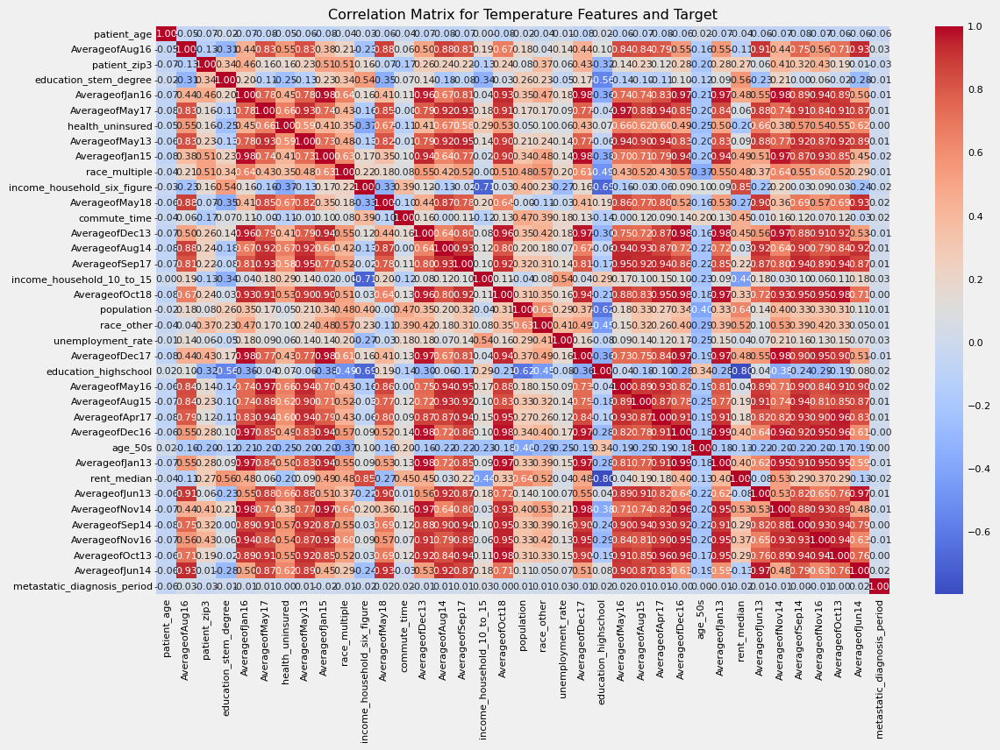

In [ ]:
def train_test_data(data, drop_cols=['source', 'patient_id', TARGET]):
    # Split the dataset into training and testing sets.
    train = data[data.source == 'train']
    X = train.drop(columns=drop_cols)
    y = train[TARGET]

    test = data[data.source == 'test'].drop(columns=drop_cols)
    return X, y, test

def rename_temperature_columns(df):
    # Rename temperature-related columns by removing special characters
    df.columns = df.columns.str.replace(' ', '_', regex=False)
    temp_features = [col for col in df.columns if col.startswith('Average')]
    new_feature_names = [temp.replace('-', '').replace('_', '') for temp in temp_features]
    rename_dict = dict(zip(temp_features, new_feature_names))
    df.rename(columns=rename_dict, inplace=True)
    return df

def mutual_info(df, y):
    # Calculate and rank features based on their mutual information with the target variable
    df = df.dropna(axis=1)
    encoded_df = data_imputer.encode_data_cardinality(df, drop_first=True, apply_cardinality=True)

    mi_scores = mutual_info_regression(encoded_df, y)
    mi_scores_df = pd.DataFrame({'Feature': encoded_df.columns, 'MI Score': mi_scores})
    mi_scores_df = mi_scores_df.sort_values(by='MI Score', ascending=False)
    return mi_scores_df

data = rename_temperature_columns(data)
X, y, X_test = train_test_data(data)
cat_f, num_f = cat_num_features(X)

mi_scores_df = mutual_info(X, y)
mi_scores_top = mi_scores_df.Feature.to_list()[:40]

# Temperature features
mi_temp_features = [temp for temp in mi_scores_top if temp.startswith('Average')]
mi_num_features = [feat for feat in mi_scores_top if feat in num_f]
mi_temp_features.append(TARGET)
mi_num_features.append(TARGET)

# Calculate correlation matrix
X[TARGET] = y.values
corr_matrix = X[mi_num_features].corr()

# Visualize correlation
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for Temperature Features and Target')
plt.show()

Additionally, temperature-related features were found to decrease model performance, as they can overshadow the contribution of high-information features.

In [ ]:
X_corr = X.copy()
X_corr[TARGET] = y.values
cat_f, num_f = cat_num_features(X_corr)

# Calculate correlation matrix
correlation_matrix = X_corr[num_f].corr()

# Select highly correlated features
threshold = 0.9
high_corr_features = [(column, row) for column in correlation_matrix.columns
                      for row in correlation_matrix.index
                      if abs(correlation_matrix.loc[row, column]) > threshold and column != row]
print(f"Number of combinations of Highly Correlated Features: {len(high_corr_features)}")

# Create a unique set using frozenset to remove duplicate pairs
unique_pairs = set(frozenset(pair) for pair in high_corr_features)
high_corr_features_set = [tuple(pair) for pair in unique_pairs]
print(f"Number of unique pairs of Highly Correlated Features: {len(high_corr_features_set)}")

high_corr_feature_names = list(set([feature for pair in high_corr_features_set for feature in pair]))
print(f"Number of Highly Correlated Features: {len(high_corr_feature_names)}")
# print("List of Highly Correlated Features:")

temp_cols = [col for col in num_f if col.startswith('Averageof')]
all_temp_features = [temp for temp in temp_cols if temp in high_corr_feature_names]

len(all_temp_features) == len(temp_cols)

Number of combinations of Highly Correlated Features: 2030
Number of unique pairs of Highly Correlated Features: 1015
Number of Highly Correlated Features: 87


True

When examining features with low correlation to the target, variables like **patient_age**, which are directly related to the patient's characteristics, are among them.

In [ ]:
target_corr = correlation_matrix[TARGET].abs().sort_values()
low_corr_features = target_corr[target_corr < 0.1].index.tolist()
print("Low Correlation Features with Target Variable:")
low_corr_features[-5:]

Low Correlation Features with Target Variable:


['income_household_10_to_15',
 'education_bachelors',
 'family_dual_income',
 'labor_force_participation',
 'patient_age']

##**`4.` Data Imputation Techniques**
<a name="imputation_tech"></a>

There are various imputers available for handling missing data. To choose the most suitable imputer for the dataset, different models have been applied, and the impact of these imputers on **RMSE** (Root Mean Square Error) scores has been observed. In splitting the dataset, two different evaluation methods were employed, with cv=1 parameter used to apply the train_test_split method for evaluation.

This approach allows for assessing the effect of different imputers on model performance, while train_test_split ensures that the data is divided into training and test sets without performing **k-fold cross-validation**. The goal is to determine the most effective imputation technique for minimizing prediction errors in the dataset.

In [ ]:
X, y, X_test = train_test_data(data)
print(X.shape, X_test.shape)
cat_f, num_f = cat_num_features(X)

# Missing categorical and numerical columns
missing_categorical,  missing_numerical = ['payer_type', 'patient_race'], ['bmi']
# Columns to be used for grouping in data imputation
group_cols_bmi = ['patient_state', 'Region', 'Division']

# Group columns for imputation
group_cols_patient_race = [
    'patient_state',
    'Region',
    'Division',
    'metastatic_cancer_diagnosis_code']
group_cols_payer_type = [
    'patient_state',
    'Region',
    'Division',
    'breast_cancer_diagnosis_code',
    'breast_cancer_diagnosis_desc',
    'metastatic_cancer_diagnosis_code']


group_cols_cat = [{'features':['patient_race'], 'group_cols': group_cols_patient_race},
                  {'features': ['payer_type'], 'group_cols': group_cols_payer_type}]
group_cols_num = [{'features': ['bmi'], 'group_cols': group_cols_bmi}]

# data_imputer = DataImputer(n_neighbors=5)
# Lists of imputers
imputers = list(data_imputer.numerical_imputers.keys())[:-2]+ list(data_imputer.categorical_imputers.keys())
print(imputers)

# List of models
models_names = data_imputer.model_constructors.keys()
models = list(models_names)[:9]
print(models)


(13168, 147) (5646, 147)
['Simple Mean', 'Simple Median', 'KNN', 'No Num Imputation', 'Simple Categorical', 'Constant Categorical', 'Group Mode']
['CatBoost', 'LGBM', 'GradientBoosting', 'ExtraTrees', 'XGB', 'AdaBoost', 'DecisionTree', 'RandomForest', 'MLPRegressor']


After removing the temperature data, imputation is performed since certain imputation methods utilize other numerical features to fill in missing values.

In [ ]:
# Drop temperature features
temp_cols = [col for col in num_f if col.startswith('Averageof')]

X_cleaned = X.drop(columns=temp_cols)
X_test_cleaned = X_test.drop(columns=temp_cols)
X_cleaned.shape, X_test_cleaned.shape

((13168, 75), (5646, 75))

When evaluating the impact of different imputation techniques on model performance, the top three models that achieved the best scores were selected for further analysis.

---START---
The best method for CatBoost: Constant Categorical and KNN, RMSE: 83.3924


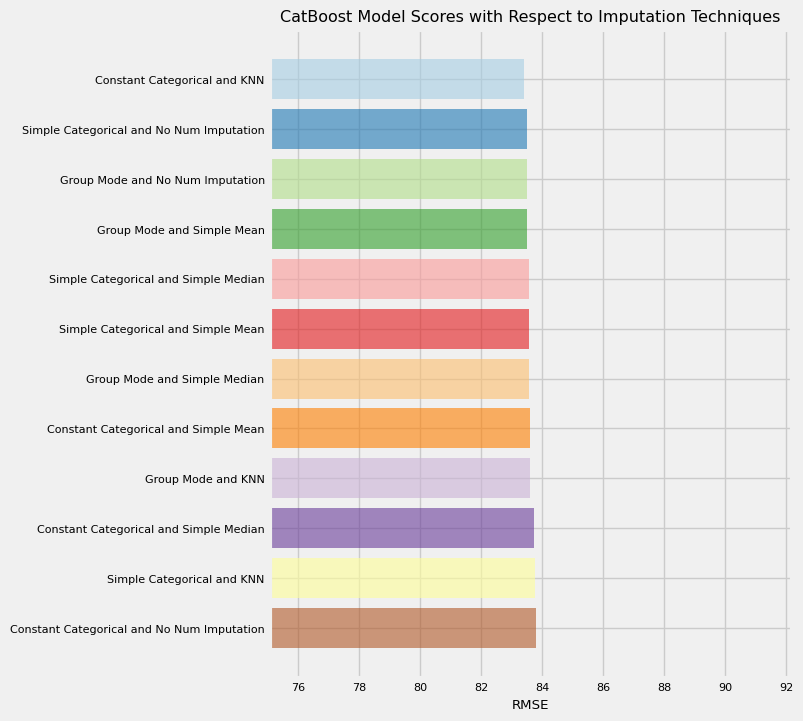

Time taken: 0:03:41.381185

The best method for LGBM: Constant Categorical and Simple Mean, RMSE: 83.8968


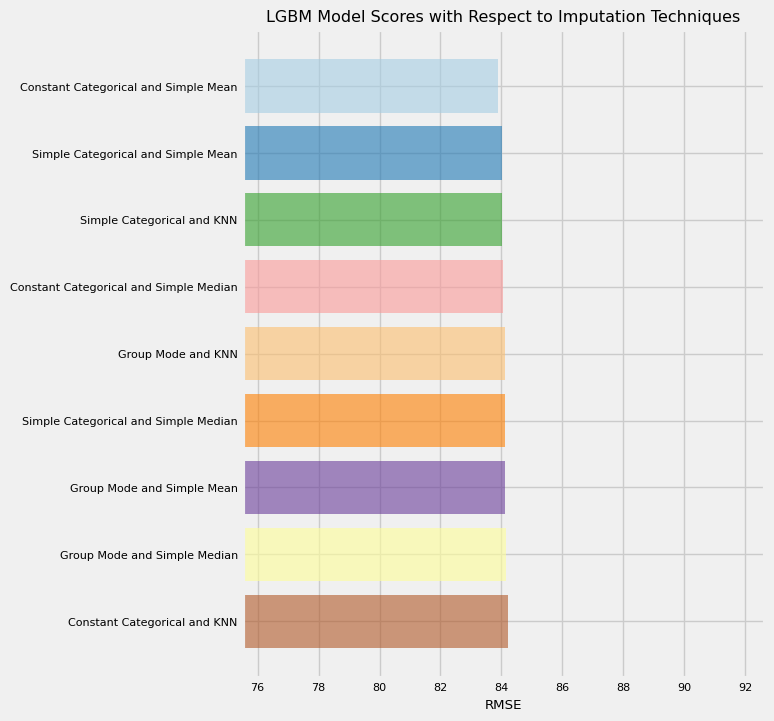

Time taken: 0:01:05.185700

The best method for GradientBoosting: Group Mode and KNN, RMSE: 82.8678


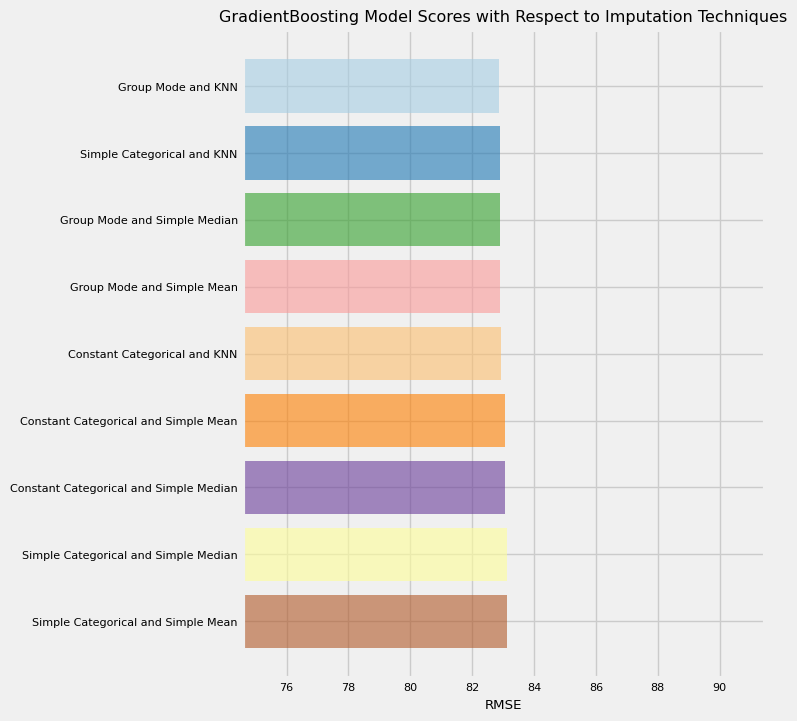

Time taken: 0:02:13.104497

The best method for ExtraTrees: Constant Categorical and KNN, RMSE: 89.0288


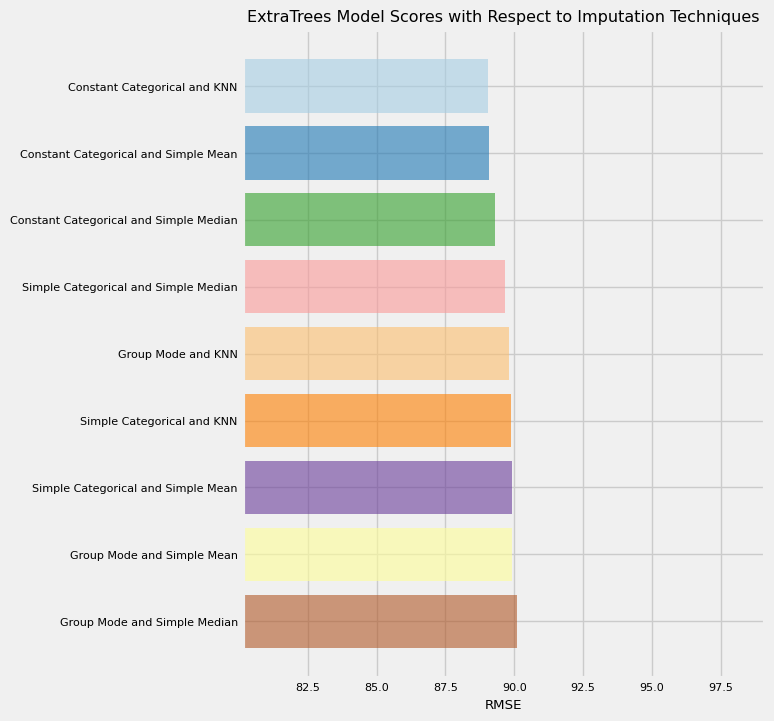

Time taken: 0:03:24.062295

The best method for XGB: Constant Categorical and Simple Median, RMSE: 87.4577


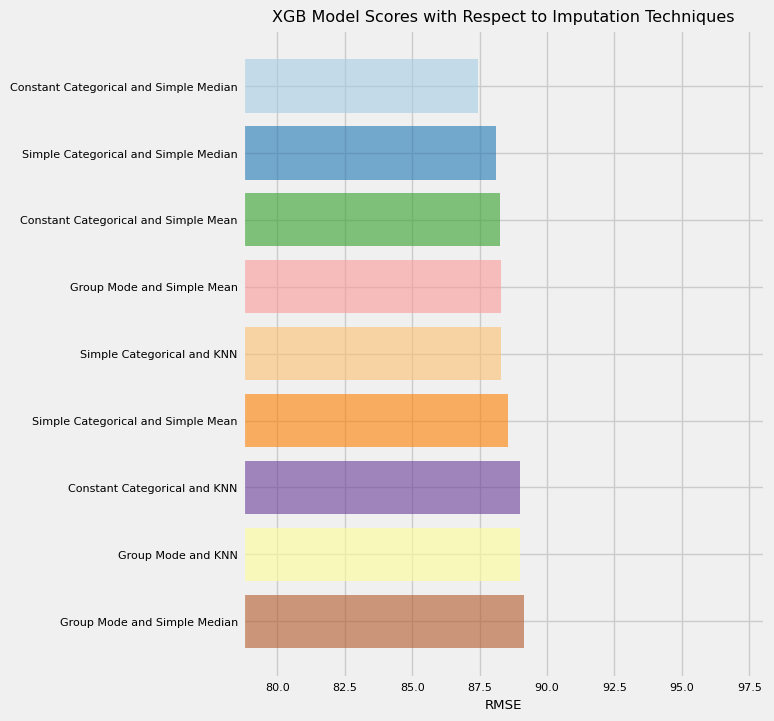

Time taken: 0:01:09.734156

The best method for AdaBoost: Constant Categorical and Simple Median, RMSE: 93.4804


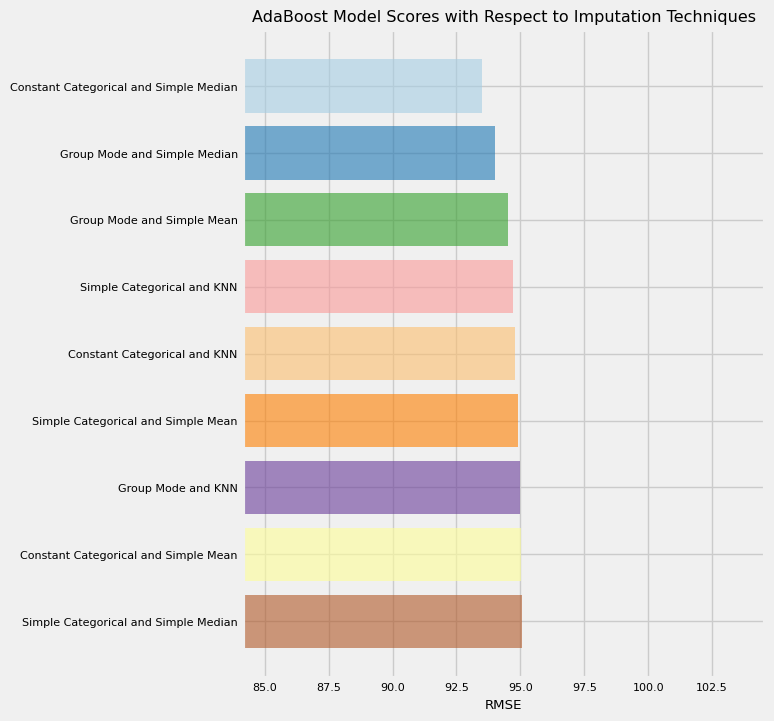

Time taken: 0:02:33.229983

The best method for DecisionTree: Group Mode and Simple Mean, RMSE: 119.4029


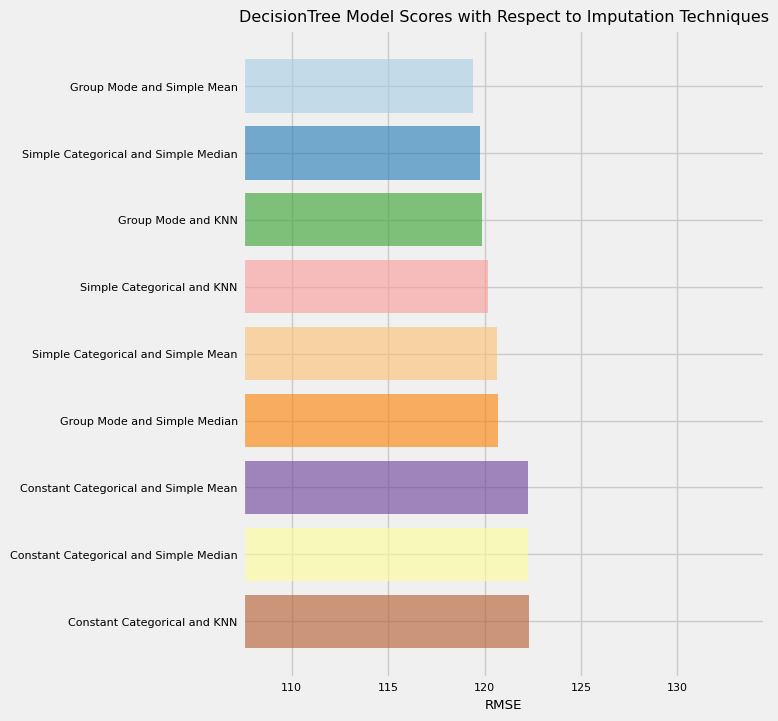

Time taken: 0:01:09.547397

The best method for RandomForest: Constant Categorical and Simple Median, RMSE: 87.6868


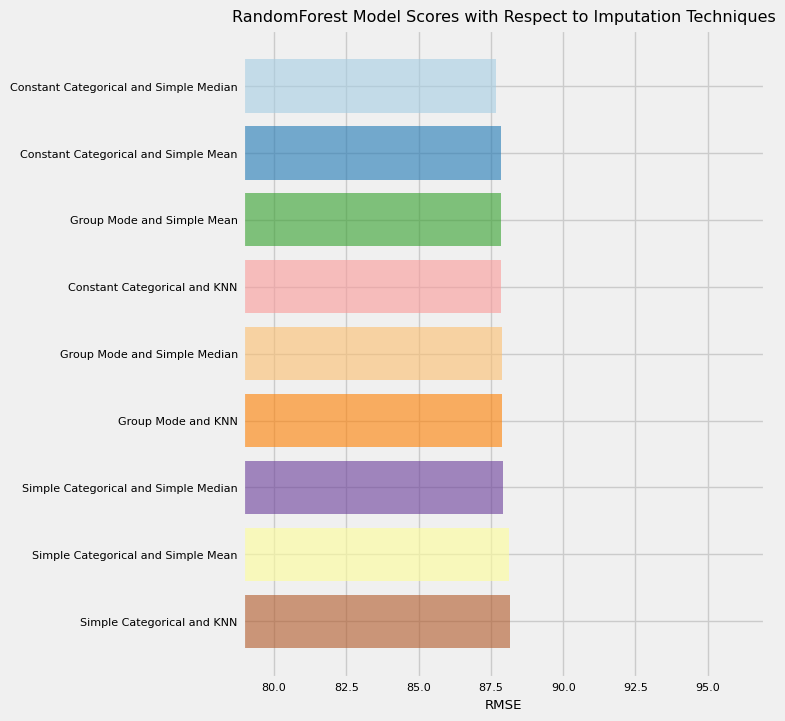

Time taken: 0:07:17.878682

The best method for MLPRegressor: Simple Categorical and Simple Mean, RMSE: 88.6755


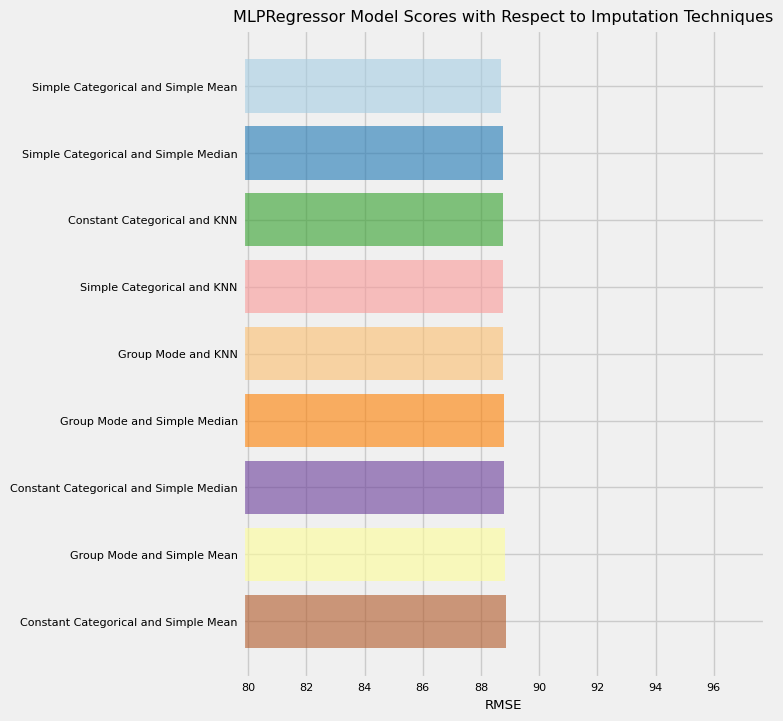

Time taken: 0:02:55.230968

---END---


In [ ]:
# Impute data
data_imputed = data_imputer.impute_and_evaluate_models(
    X_cleaned,
    y,
    models,
    missing_categorical,
    missing_numerical,
    group_cols_cat=group_cols_cat,
    group_cols_num=group_cols_num,
    imputers=imputers,
    # visualize_first=True,
    visualize=True,
    cv=1,
    apply_cardinality=True,
    X_test=X_test_cleaned)

---START---
The best method for CatBoost: Constant Categorical and Simple Mean, RMSE: 82.5834, Std: 1.9870


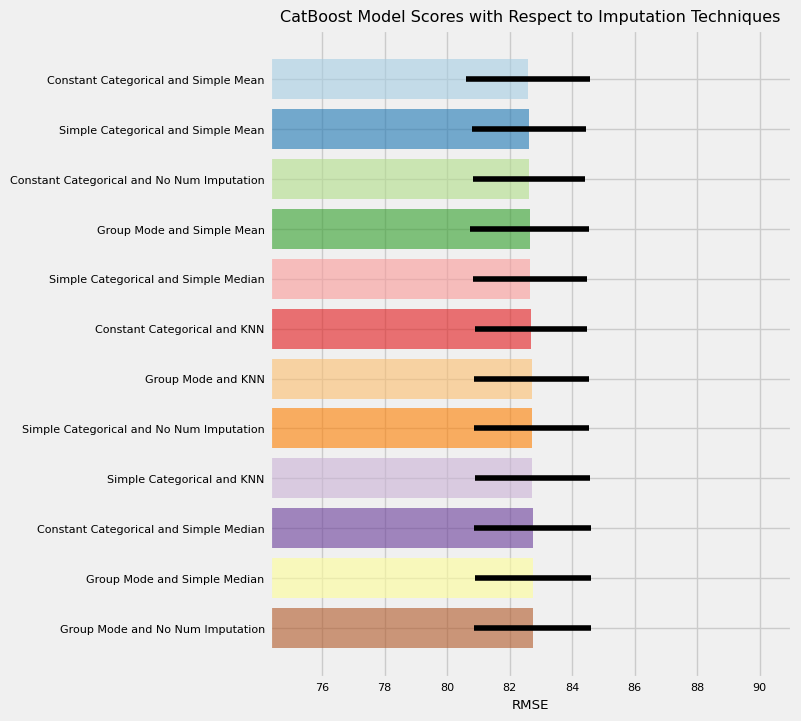

Time taken: 0:41:07.966120

---END---


In [ ]:
models_names = data_imputer.model_constructors.keys()
models = list(models_names)[:1]

data_imputed = data_imputer.impute_and_evaluate_models(
    X_cleaned,
    y,
    models,
    missing_categorical,
    missing_numerical,
    group_cols_cat=group_cols_cat,
    group_cols_num=group_cols_num,
    imputers=imputers,
    visualize=True,
    cv=9,
    apply_cardinality=True,
    X_test=X_test_cleaned)

## **`5.` Impute Data**
<a name="impute_data"></a>

These are the results of the three models with the lowest RMSE values, based on the impact of different imputer techniques applied to them.

In [ ]:
train_catboost, test_catboost = data_imputed[0]['train'], data_imputed[0]['test']
print(train_catboost.shape, test_catboost.shape)

train_lgbm, test_lgbm = data_imputed[1]['train'], data_imputed[1]['test']
print(train_lgbm.shape, test_lgbm.shape)

train_gradient, test_gradient = data_imputed[2]['train'], data_imputed[2]['test']
print(train_gradient.shape, test_gradient.shape)

(13168, 75) (5646, 75)
(13168, 75) (5646, 75)
(13168, 75) (5646, 75)


For handling missing values in both categorical and numerical features, specific imputer models and methods can be defined and applied directly to the dataset, skipping the need for additional analysis steps. By identifying the type of missing data in each feature, imputers like SimpleImputer for numerical values and for categorical values can be configured accordingly.

The following process is filling the missing values before proceeding with feature engineering, ensuring that the dataset is complete and ready for subsequent steps. By streamlining the process, the imputation step prepares the data for further analysis or modeling without requiring intermediate evaluations, allowing for a more efficient workflow in data preparation.

In [ ]:
def impute_data(X, cat_name, num_name):
    cat_features, num_features = cat_num_features(X)

    cat_imputer = data_imputer.categorical_imputers[cat_name]
    num_imputer = data_imputer.numerical_imputers[num_name]

    X_imputed, test_imputed = data_imputer.impute(
        X,
        cat_name,
        num_name,
        cat_imputer,
        num_imputer,
        num_features,
        cat_features,
        missing_numerical,
        missing_categorical,
        group_cols_cat,
        group_cols_num,
        X_test=X_test)

    return X_imputed, test_imputed


In [ ]:
# Drop temperature features
temp_cols = [col for col in num_f if col.startswith('Averageof')]
data_no_temp = data.drop(columns=temp_cols)
X, y, X_test = train_test_data(data_no_temp)

cat_name1 = 'Constant Categorical'
cat_name2 = 'Group Mode'
cat_name3 = 'Simple Categorical'
num_name1 = 'KNN'
num_name2 = 'Simple Mean'

# CatBoost Data
train_catboost, test_catboost =  impute_data(X, cat_name1, num_name1)
# train_catboost, test_catboost =  impute_data(X, cat_name1, num_name2)

print(train_catboost.shape, test_catboost.shape)

# LightGBM Data
train_lgbm, test_lgbm =  impute_data(X, cat_name1, num_name2)

print(train_lgbm.shape, test_lgbm.shape)

# Gradient Data
train_gradient, test_gradient =  impute_data(X, cat_name2, num_name1)

print(train_gradient.shape, test_gradient.shape)

(13168, 75) (5646, 75)
(13168, 75) (5646, 75)
(13168, 75) (5646, 75)


In [ ]:
train_catboost.isna().sum().sum(), train_lgbm.isna().sum().sum(), train_gradient.isna().sum().sum()

(0, 0, 0)

## **`6.` Generate Features**
<a name="gen_feats"></a>

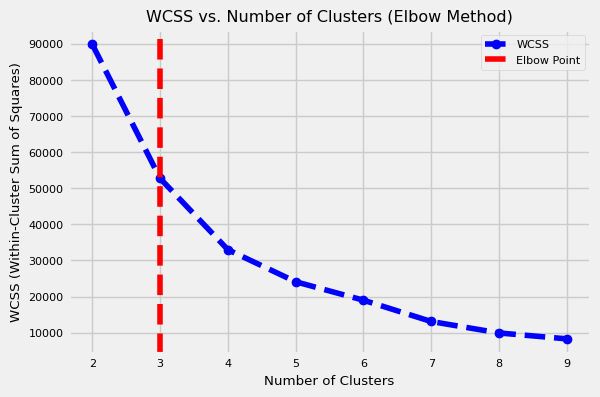

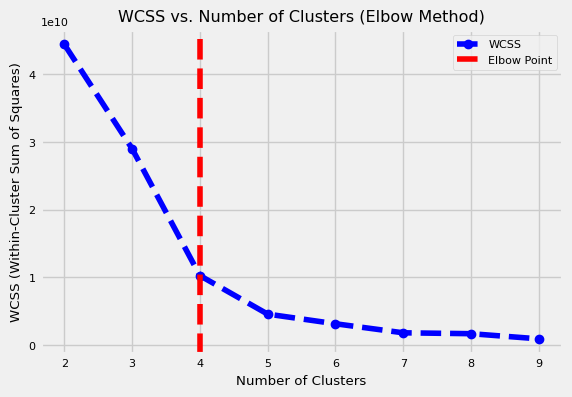

In [ ]:
# Check k value for features
features = ['bmi', 'density']
for feature in features:
    elbow_point, min_wcss_at_elbow = Find_K_with_elbow(train_catboost[[feature]])

In this feature engineering process, new features are created to capture significant relationships within the data, aiming to enhance the predictive power of the model. During the analysis, the bmi feature was grouped into categories. Although the Silhouette Score indicated that the groups were relatively close to each other, this grouping still led to improved results in model-specific feature selection.


In [ ]:
def generate_features(df_train_org, df_test_org, data='CatBoost Data', generate=False):
    df_train = df_train_org.copy()
    df_test = df_test_org.copy()

    if generate:
        print_bold(f"Generating features for {data}...")
        df_train, df_test = feature_groups_function(df_train, df_test, feature='density', n_clusters=4)
        df_train, df_test = feature_groups_function(df_train, df_test, feature='bmi', n_clusters=3)

    return df_train, df_test

# Apply feature generation to different datasets
generate = True

train_featured_catboost, test_featured_catboost = generate_features(train_catboost, test_catboost, generate=generate)

train_featured_gradient, test_featured_gradient = generate_features(train_gradient, test_gradient, data='GradientBoosting Data', generate=generate)

train_featured_lgbm, test_featured_lgbm = generate_features(train_lgbm, test_lgbm, data='LGBM Data', generate=generate)

train_featured_catboost.shape, train_featured_gradient.shape, train_featured_lgbm.shape

Generating features for CatBoost Data...K-Means Groups for density w n_clusters: 4:
Silhouette Score: 0.7838528119077941
Davies-Bouldin Index: 0.28471516339990005

K-Means Groups for bmi w n_clusters: 3:
Silhouette Score: 0.5228148336179987
Davies-Bouldin Index: 0.5934120600856841

Generating features for GradientBoosting Data...K-Means Groups for density w n_clusters: 4:
Silhouette Score: 0.7838528119077941
Davies-Bouldin Index: 0.28471516339990005

K-Means Groups for bmi w n_clusters: 3:
Silhouette Score: 0.5228148336179987
Davies-Bouldin Index: 0.5934120600856841

Generating features for LGBM Data...K-Means Groups for density w n_clusters: 4:
Silhouette Score: 0.7838528119077941
Davies-Bouldin Index: 0.28471516339990005

K-Means Groups for bmi w n_clusters: 3:
Silhouette Score: 0.8392308357111891
Davies-Bouldin Index: 0.3335838665890165



((13168, 77), (13168, 77), (13168, 77))

# **`5.` Regression Modelling**
<a name="regression"></a>

A variety of regression models were evaluated, including:

- **CatBoost Regression**
- **Gradient Boosting Regression**
- **LightGBM Regression**

## **`1.` Establish Baseline Scores and SHAP (SHapley Additive exPlanations) for Feature Importance**
<a name="baseline"></a>

- **SHAP (SHapley Additive exPlanations)**

**SHAP** provides explanations for model predictions by calculating the contribution of each feature, using cooperative game theory principles. In this context, SHAP is applied with the models to assist in feature selection based on their importance to the model's predictions.

This process can be somewhat challenging for this model, as it does not natively handle categorical data, which necessitates encoding. The visual shows that one of the top 20 most significant features contains an encoded value. Therefore, this feature will be excluded from the feature selection process.

In [ ]:
def shap_summary_plot(model, X_val):
    # Use SHAP to explain the model's predictions
    explainer = shap.Explainer(model)
    shap_values = explainer(X_val)

    # Plot the SHAP values without showing it yet
    shap.summary_plot(shap_values, X_val, show=False)

    # Get the most important features according to the SHAP values
    shap_importance = pd.DataFrame({
        'feature': X_val.columns,
        'importance': np.abs(shap_values.values).mean(axis=0)
    })

    # Sort by importance
    shap_importance = shap_importance.sort_values(by='importance', ascending=False)


    plt.title(f'SHAP Summary Plot for {type(model).__name__}')
    plt.tight_layout()
    plt.show()

    return shap_importance

The top 3 models are re-run using the latest version of the data to observe the effects of the modifications. New scores, including **RMSE** and **R²**, are calculated to evaluate the model's performance after these changes. This process ensures that the optimizations or feature engineering steps have improved the model's predictive ability, and provides a comparative baseline against the previous version of the model.

In [ ]:
def build_catboost_model(X, y, test=None, model_params=None, early_stopping_rounds=None, shap=False, print_scores=False):
    final_prediction = []

    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=seed)
    cat_features, num_features = cat_num_features(X)

    # CatBoost Pool
    train_pool = Pool(X_train, y_train, cat_features=cat_features)
    val_pool = Pool(X_val, y_val, cat_features=cat_features)

    default_params = {
        'custom_metric': ['R2', 'RMSE'],
        'random_seed': seed,
        'boosting_type':'Plain'
        }

    if model_params:
        default_params.update(model_params)

    model = CatBoostRegressor(**default_params)
    verbose=500
    # Train
    if early_stopping_rounds is not None:
        model.fit(train_pool, eval_set=val_pool, verbose=verbose, use_best_model=True, early_stopping_rounds=early_stopping_rounds)

    else:
        model.fit(train_pool, eval_set=val_pool, verbose=verbose)

    # SHAP analysis
    shap_importance = []
    if shap:
        # Feature Importance by SHAP
        shap_importance = shap_summary_plot(model, X_val)

    rmse = data_imputer.rmse_score(y_val, model.predict(X_val))
    r2 = r2_score(y_val, model.predict(X_val))

    if print_scores:
        print(f"RMSE: {rmse:.5f}, R2: {r2:.5f}")

    if test is not None and not test.empty:
        test_pool = Pool(test, cat_features=cat_features)
        test_preds = model.predict(test_pool)
        final_prediction.append(test_preds)
        return test_preds

    return rmse, r2, model, X_val, shap_importance

Learning rate set to 0.073696
0:	learn: 105.9458071	test: 104.9508004	best: 104.9508004 (0)	total: 53.2ms	remaining: 53.2s
500:	learn: 73.1639453	test: 83.3761396	best: 82.9126341 (158)	total: 7.21s	remaining: 7.18s
999:	learn: 67.2774849	test: 83.8617269	best: 82.9126341 (158)	total: 14.7s	remaining: 0us

bestTest = 82.91263413
bestIteration = 158

Shrink model to first 159 iterations.


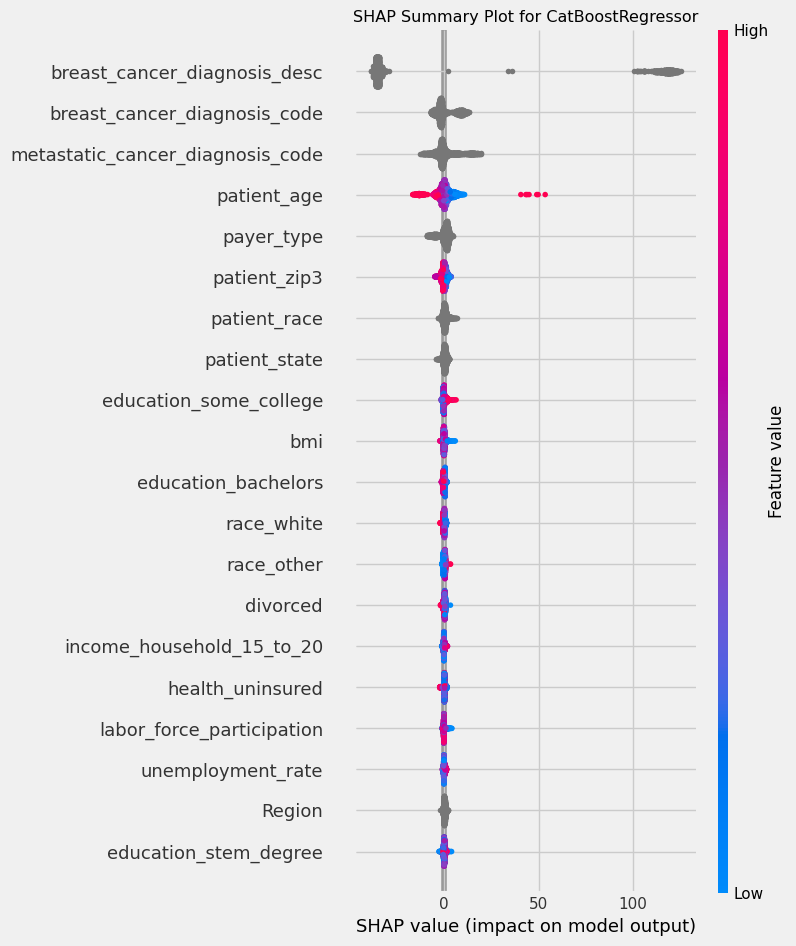

RMSE: 82.91263, R2: 0.41193


In [ ]:
_, _, model, _, shap_importance = build_catboost_model(
    train_featured_catboost,
    y,
    shap=True,
    print_scores=True)

features_catboost = shap_importance.iloc[:20]['feature'].to_list()

In [ ]:
def build_other_model(X, y, model):
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=seed)
    X_train, X_val = data_imputer.encode_data_cardinality(X_train, X_test= X_val, drop_first=True)

    model.fit(X_train, y_train)

    # Feature Importance
    shap_importance = shap_summary_plot(model, X_val)

    y_pred = model.predict(X_val)
    rmse = data_imputer.rmse_score(y_val, y_pred)
    r2 = r2_score(y_val, y_pred)
    print(f"RMSE: {rmse:.5f}, R2: {r2:.5f}")

    return shap_importance


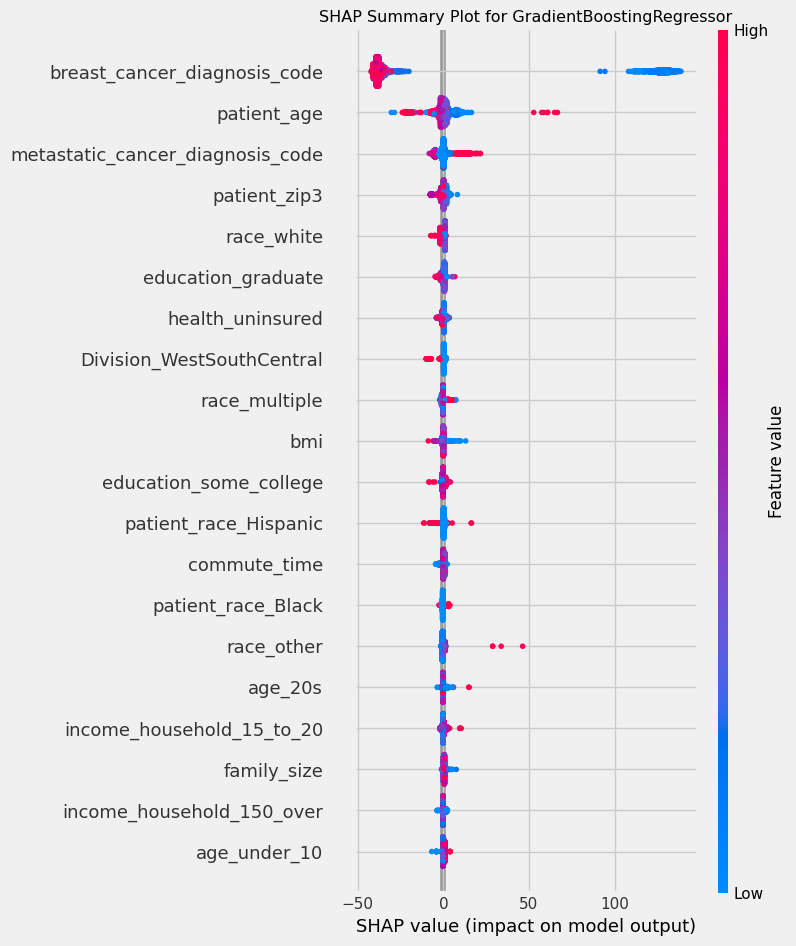

RMSE: 82.98854, R2: 0.41085


In [ ]:
shap_importance = build_other_model(
    train_featured_gradient,
    y,
    data_imputer.get_regressor('GradientBoosting'))

features_gradient = shap_importance.iloc[:25]['feature'].to_list()
features_gradient = [feature for feature in features_gradient if feature in train_featured_gradient.columns.to_list()]

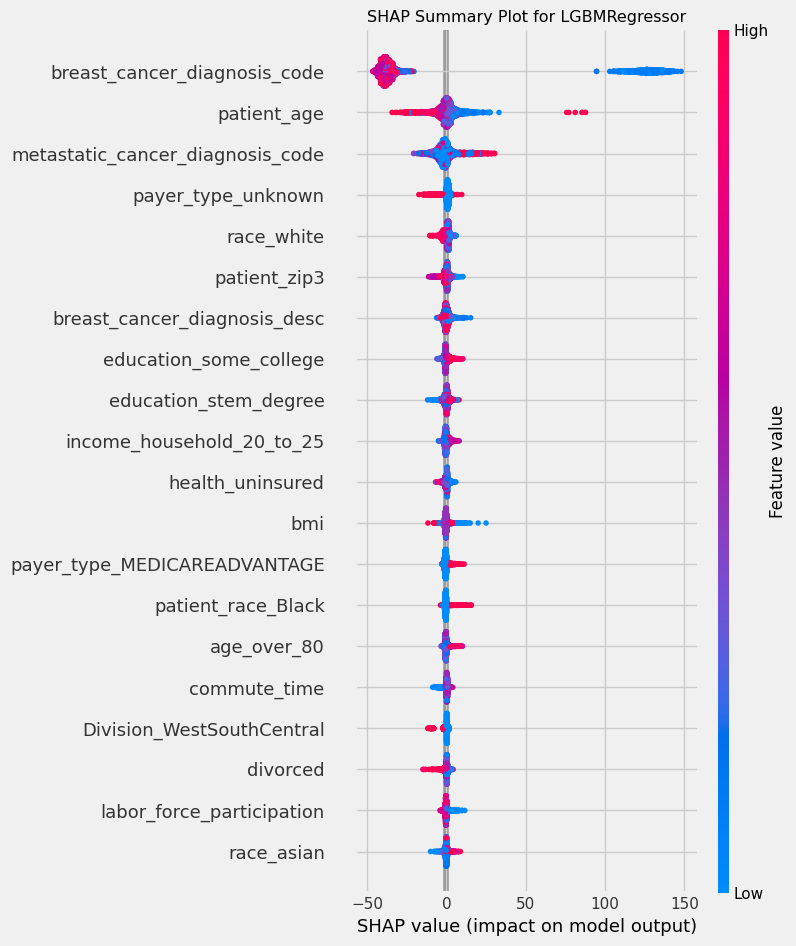

RMSE: 83.98983, R2: 0.39655


In [ ]:
shap_importance = build_other_model(
    train_featured_lgbm,
    y,
    data_imputer.get_regressor('LGBM'))

features_lgbm = shap_importance.iloc[:25]['feature'].to_list()
features_lgbm = [feature for feature in features_lgbm if feature in train_featured_lgbm.columns.to_list()]

In [ ]:
common_feature = [feature for feature in features_catboost if feature in features_gradient and feature in features_lgbm]
common_feature

['breast_cancer_diagnosis_code',
 'metastatic_cancer_diagnosis_code',
 'patient_age',
 'patient_zip3',
 'education_some_college',
 'bmi',
 'race_white',
 'race_other',
 'income_household_15_to_20',
 'health_uninsured',
 'education_stem_degree']

## **`2.` Backward Selection**
<a name="backward"></a>

Backward feature elimination is performed based on SHAP values obtained from a previously trained CatBoost model, where the top 20 most important features were identified. The elimination process continues until a maximum of 9 features remain.

In [ ]:
def get_dropped_feature(model, X_val):
    explainer = shap.Explainer(model)
    shap_values = explainer(X_val)
    feature_importance = shap_values.abs.mean(0).values
    importance_df = pd.DataFrame({'features': X_val.columns,
                                  'importance': feature_importance})
    importance_df.sort_values(by='importance', ascending=False, inplace=True)
    return importance_df['features'].iloc[-1]

def backward_selection(df, y, max_features=None):
    # Initialize variables
    model_params = {
        'loss_function':'RMSE',
        'random_seed': seed,
        'boosting_type':'Plain',
        'logging_level':'Silent'}

    rmse_values = []
    feature_counts = []
    best_rmse = float('inf')
    best_df = pd.DataFrame()

    # Get baseline RMSE
    select_df = df.copy()
    total_features = df.shape[1]
    rmse, _, model, X_val, _ = build_catboost_model(
        select_df,
        y,
        model_params=model_params)

    rmse_values.append(rmse)
    feature_counts.append(select_df.shape[1])

    # Store best RMSE and corresponding DataFrame
    if rmse < best_rmse:
        best_rmse = rmse
        best_df = select_df.copy()

    last_rmse = rmse

    # Drop least important feature and recalculate model performance
    if max_features is None:
        max_features = total_features - 1

    for num_features in range(total_features - 1, 1, -1):
        # Trim features
        dropped_feature = get_dropped_feature(model, X_val)
        tmp_df = select_df.drop(columns=[dropped_feature])

        # Rerun modeling
        rmse, _, model, X_val, _ = build_catboost_model(
            tmp_df,
            y,
            model_params=model_params)

        rmse_values.append(rmse)
        feature_counts.append(tmp_df.shape[1])
        # print(f"{rmse} with {tmp_df.shape[1]}")

        # Check if the new RMSE is the best
        if rmse < best_rmse:
            best_rmse = rmse
            best_df = tmp_df.copy()

        if (num_features < max_features) and (rmse > last_rmse):
            break
        else:
            last_rmse = rmse
            select_df = tmp_df

    print(f"Best RMSE with {best_df.shape[1]} features: {best_rmse:.4f}")

    # Plotting the RMSE vs Number of features graph
    plt.plot(feature_counts, rmse_values, marker='o', color='y')
    plt.title('Backward Feature Selection: RMSE vs Number of Features')
    plt.xlabel('Number of Features')
    plt.ylabel('RMSE')
    plt.grid(True)
    plt.show()

    print(f"Selected columns: {best_df.columns}")

    return best_df

Best RMSE with 16 features: 82.5664


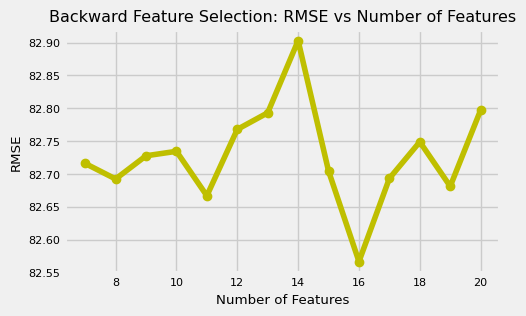

Selected columns: Index(['breast_cancer_diagnosis_desc', 'breast_cancer_diagnosis_code',
       'metastatic_cancer_diagnosis_code', 'patient_age', 'payer_type',
       'patient_zip3', 'patient_race', 'patient_state',
       'education_some_college', 'education_bachelors', 'race_white',
       'race_other', 'divorced', 'income_household_15_to_20',
       'health_uninsured', 'labor_force_participation'],
      dtype='object')

Time taken: 0:02:11.144497



In [ ]:
t1 = datetime.now()
reduced_df = backward_selection(train_featured_catboost[features_catboost], y, max_features=9)

t2 = datetime.now()
print(f"\nTime taken: {t2 - t1}\n")

## **`3.` Hyperparameter Tuning**
<a name="hyp_tuning"></a>

After feature selection, **GridSearchCV** was utilized for hyperparameter tuning to identify the optimal parameter values. The parameter values were then adjusted based on the results to enhance model performance.

In [ ]:
def perform_grid_search_cv(model, param_grid, X, y, cv=3, random_state=seed):
    grid_search = GridSearchCV(model, param_grid, cv=cv, n_jobs=-1)
    grid_search.fit(X, y)

    best_params = grid_search.best_params_
    print(f"Best parameters: {best_params}")

    # Retrain with best parameters
    best_model = model.set_params(**best_params, random_state=random_state)

    # Cross validation results
    scores = data_imputer.cross_val_score_func(best_model, X, y)

    scores_mean = scores.mean()
    scores_std = scores.std()

    return best_model, scores_mean, scores_std

# Grid parameters for CatBoost
param_grid = {
    'learning_rate': [0.3, 0.5],
    'depth': [8, 10],
    'l2_leaf_reg': [1, 3],
    # 'subsample': [0.9, 1.0],
    # 'colsample_bylevel': [0.5, 0.7, 0.9, 1.0],
    'border_count': [32, 50],
    'ctr_target_border_count': [8, 10],
}

cat_features, num_features = cat_num_features(train_featured_catboost[features_catboost])
t1 = datetime.now()
catboost_regressor = CatBoostRegressor(cat_features=cat_features, boosting_type='Plain', random_state=seed, verbose=0)
best_model, scores_mean, scores_std = perform_grid_search_cv(catboost_regressor, param_grid, train_featured_catboost[features_catboost], y, cv=3)

t2 = datetime.now()
print(f"\nTime taken: {t2 - t1}\n")

# Best parameters: {'border_count': 50, 'ctr_target_border_count': 10, 'depth': 8, 'l2_leaf_reg': 3, 'learning_rate': 0.3, 'n_estimators': 1000}

Best parameters: {'border_count': 50, 'ctr_target_border_count': 10, 'depth': 8, 'l2_leaf_reg': 3, 'learning_rate': 0.3, 'n_estimators': 1000}

Time taken: 2:42:28.138673



In [ ]:
# Hyperparameter tuning GradientBoosting
cat_features, num_features = cat_num_features(train_featured_gradient[features_gradient[:12]])

# Data transformation
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), cat_features),
        ('num', 'passthrough', num_features)
    ])

# Combine GradientBoosting model with pipeline
model_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', GradientBoostingRegressor(random_state=seed))
])

# Hyperparameter grid
param_grid = {
    'regressor__learning_rate': [0.01, 0.1, 0.2],
    'regressor__n_estimators': [500, 700],
    'regressor__max_depth': [5, 7],
    'regressor__min_samples_split': [5, 10]
}

t1 = datetime.now()
grid_search = GridSearchCV(model_pipeline, param_grid, cv=3, n_jobs=-1)
grid_search.fit(train_featured_gradient[features_gradient], y)

t2 = datetime.now()
print(f"GradientBoosting Time taken: {t2 - t1}\n")

# Best parameters
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")
# Best parameters: {'regressor__learning_rate': 0.01, 'regressor__max_depth': 5, 'regressor__min_samples_split': 10, 'regressor__n_estimators': 700}

GradientBoosting Time taken: 0:05:54.084877

Best parameters: {'regressor__learning_rate': 0.01, 'regressor__max_depth': 5, 'regressor__min_samples_split': 5, 'regressor__n_estimators': 700}


## **`4.` K-Fold Cross-Validation for Predictive Modeling**
<a name="k_fold"></a>

**KFold** and **StratifiedKFold** cross-validation techniques were selected and applied to CatBoostRegressor, GradientBoostingRegressor, and LGBMRegressor models. These methods were chosen to ensure robust performance evaluation, taking into account the nature of the data and model requirements.

In [ ]:
def fit_catboost(X_train, X_val, y_train, y_val, test, cat_features, params, early_stopping_rounds):
    train_pool = Pool(X_train, label=y_train, cat_features=cat_features)
    val_pool = Pool(X_val, label=y_val, cat_features=cat_features)

    model = CatBoostRegressor(**params)
    model.fit(train_pool, eval_set=val_pool, use_best_model=True, early_stopping_rounds=early_stopping_rounds)

    y_pred = model.predict(X_val)

    # Predict on test data if available
    test_preds = model.predict(Pool(test, cat_features=cat_features)) if test is not None else None

    return y_pred, test_preds

def fit_other_model(X_train, X_val, y_train, y_val, test, model_name, default_params):
    # Encoding
    X_encoded, X_val_encoded = data_imputer.encode_data_cardinality(X_train, X_test=X_val, drop_first=True)

    if model_name == 'GradientBoosting':
        model = data_imputer.get_regressor('GradientBoosting', params=default_params)
    elif model_name == 'LGBM':
        model = data_imputer.get_regressor('LGBM', params=default_params)
    else:
        raise ValueError("Unsupported model name. Choose 'GradientBoosting' or 'LGBM'.")

    model.fit(X_encoded, y_train)
    y_pred = model.predict(X_val_encoded)

    # Predict on test data if available
    test_preds = model.predict(data_imputer.encode_data_cardinality(X_train, X_test=test, drop_first=True)[1]) if test is not None else None

    return y_pred, test_preds

def fit_and_evaluate_model(X_train, X_val, y_train, y_val, test, cat_features, model_name, default_params, early_stopping_rounds):
    if model_name == 'CatBoost':
        return fit_catboost(X_train, X_val, y_train, y_val, test, cat_features, default_params, early_stopping_rounds)
    elif model_name in ['GradientBoosting', 'LGBM']:
        return fit_other_model(X_train, X_val, y_train, y_val, test, model_name, default_params)
    else:
        raise ValueError("Unsupported model name: Choose 'CatBoost', 'GradientBoosting', or 'LGBM'.")

def get_splitter(fold, n_splits):
    if fold == 'StratifiedKFold':
        return StratifiedKFold(n_splits=n_splits, random_state=seed, shuffle=True)
    elif fold == 'KFold':
        return KFold(n_splits=n_splits, random_state=seed, shuffle=True)
    else:
        raise ValueError("Invalid fold method. Choose either 'KFold' or 'StratifiedKFold'.")

def cross_validation_predict(train, y, test=None, model_params=None, model_name='CatBoost', skf_group=None, fold='StratifiedKFold', n_splits=9, early_stopping_rounds=500):
    cat_features, _ = cat_num_features(train)
    default_params = {}

    if model_params is not None:
        default_params.update(model_params)
    # print(default_params)

    splitter = get_splitter(fold, n_splits)
    oof_preds = np.zeros(train.shape[0])  # Out-of-Fold predictions
    final_predictions = np.zeros(test.shape[0]) if test is not None else None
    final_predictions = []
    fold_scores = []

    groups = np.array(train[skf_group]) if fold == 'StratifiedKFold' else None
    if groups is not None:
        print(f"skf_group: {skf_group}\n")

    # Iterate over folds
    for fold_idx, (train_index, val_index) in enumerate(splitter.split(train, y, groups=groups), 1):
        X_train, X_val = train.iloc[train_index], train.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        # Fit model and get predictions
        y_pred, test_preds = fit_and_evaluate_model(
            X_train,
            X_val,
            y_train,
            y_val,
            test,
            cat_features,
            model_name,
            default_params,
            early_stopping_rounds
        )
        # Keep folds prediction
        oof_preds[val_index] = y_pred
        if test_preds is not None:
            final_predictions.append(test_preds)

        # Calculate scores
        rmse = data_imputer.rmse_score(y_val, y_pred)
        r2 = r2_score(y_val, y_pred)

        # Calculate bias for the fold
        bias = np.mean(y_pred - y_val)
        # bias = 0

        fold_scores.append({'fold': fold_idx, 'RMSE': rmse, 'R2': r2, 'Bias': bias})

        print(f"Fold_{fold_idx} --- RMSE: {rmse:.4f}, R2: {r2:.5f}, Bias: {bias:.5f}")

    # Average scores
    average_rmse = np.mean([score['RMSE'] for score in fold_scores])
    average_r2 = np.mean([score['R2'] for score in fold_scores])
    average_bias = np.mean([score['Bias'] for score in fold_scores])

    print(f"Average RMSE: {average_rmse:.4f}")
    print(f"Average R2: {average_r2:.4f}\n")
    print(f"Average Bias: {average_bias:.5f}\n")

    return final_predictions, oof_preds, average_rmse, average_r2, average_bias, fold_scores


In [ ]:
# Set the model parameters and other settings
catboost_params = {'ctr_target_border_count': 10, 'boosting_type':'Plain', 'random_seed':seed, 'verbose': False}
params = {}
n_splits = 9
folds = ['StratifiedKFold', 'KFold']
model_names = ['CatBoost', 'GradientBoosting', 'LGBM']
preds = []

t1 = datetime.now()
for model_name in model_names:
    print_bold(f"Model: {model_name}\n")
    selected_features, model_params = None, None
    df_train, df_test = None, None

    if model_name == 'CatBoost':
        selected_features = reduced_df.columns.tolist()
        df_train, df_test = train_featured_catboost.copy(), test_featured_catboost.copy()
        model_params = catboost_params

    elif model_name == 'LGBM':
        selected_features = features_lgbm
        df_train, df_test = train_featured_lgbm.copy(), test_featured_lgbm.copy()
        model_params = params

    elif model_name == 'GradientBoosting':
        selected_features = features_gradient
        df_train, df_test = train_featured_gradient.copy(), test_featured_gradient.copy()
        model_params = params

    print(model_params)

    """
    selected_features = [
        'breast_cancer_diagnosis_desc',
        'patient_age',
        'metastatic_cancer_diagnosis_code',
        'breast_cancer_diagnosis_code',
        'payer_type',
        'patient_zip3',
        'patient_race',
        'education_some_college',
        'patient_state']
    """
    selected_features = reduced_df.columns.tolist()
    max_feature = len(selected_features)
    # max_feature = 9
    min_feature = 8

    # StratifiedKFold group feature
    skf_group = 'breast_cancer_diagnosis_desc'
    if skf_group not in selected_features:
        skf_group = selected_features[0]

    for i in range(max_feature, min_feature, -1):
        sub_features = selected_features[:i]
        print(sub_features)
        for fold in folds:
            if model_name != 'CatBoost':
                if fold == 'StratifiedKFold':
                    continue
            else:
                if fold == 'KFold':
                    continue

            print_bold(f"Using {fold} and {len(sub_features)}-features:\n")
            if df_train is not None and df_test is not None:
                final_predictions, oof_preds, avg_rmse, avg_r2, avg_bias, fold_scores = cross_validation_predict(
                    train=df_train[sub_features],
                    y=y,
                    test=df_test[sub_features],
                    model_params=model_params,
                    model_name=model_name,
                    skf_group=skf_group,
                    fold=fold,
                    n_splits=n_splits)
                preds.append({'model_name': model_name, 'Fold': fold, 'split':n_splits, 'feats': sub_features, 'n_feats': len(sub_features), 'avg_rmse': avg_rmse, 'avg_r2':avg_r2, 'avg_bias': avg_bias, 'pred': final_predictions, 'oof_preds': oof_preds})

t2 = datetime.now()
total_time = t2 - t1

print(f"\nTotal time taken: {total_time}")

Model: CatBoost
{'ctr_target_border_count': 10, 'boosting_type': 'Plain', 'random_seed': 42, 'verbose': False}
['breast_cancer_diagnosis_desc', 'breast_cancer_diagnosis_code', 'metastatic_cancer_diagnosis_code', 'patient_age', 'payer_type', 'patient_zip3', 'patient_race', 'patient_state', 'education_some_college']
Using StratifiedKFold and 9-features:
skf_group: breast_cancer_diagnosis_desc

Fold_1 --- RMSE: 80.7153, R2: 0.45745, Bias: 0.19608
Fold_2 --- RMSE: 86.6879, R2: 0.37969, Bias: -1.93071
Fold_3 --- RMSE: 81.4715, R2: 0.44825, Bias: -0.22920
Fold_4 --- RMSE: 81.3667, R2: 0.43644, Bias: 0.78220
Fold_5 --- RMSE: 81.3276, R2: 0.43156, Bias: 0.43257
Fold_6 --- RMSE: 79.6761, R2: 0.45932, Bias: -2.44244
Fold_7 --- RMSE: 82.0437, R2: 0.42864, Bias: 2.21100
Fold_8 --- RMSE: 79.2719, R2: 0.46921, Bias: -0.30950
Fold_9 --- RMSE: 80.0397, R2: 0.46547, Bias: 0.70014
Average RMSE: 81.4000
Average R2: 0.4418

Average Bias: -0.06554

Model: GradientBoosting
{}
['breast_cancer_diagnosis_desc'

The analysis, accounting for bias, reveals the following insights:

**CatBoost (StratifiedKFold):** Optimal performance is observed at around 9 features, where avg_rmse and private_score are minimized. However, avg_bias shows fluctuations across feature counts, indicating potential overfitting as the feature count increases, particularly beyond 12 features.

**GradientBoosting:** As the number of features increases, avg_rmse and avg_r2 improve, yet avg_bias steadily decreases, suggesting that additional features help reduce bias. However, this comes with variability in public_score and private_score, highlighting that lower bias does not necessarily translate to consistently better generalization.

**LGBM:** The model shows fluctuating avg_bias across feature counts, with minor improvements in avg_rmse. While bias decreases slightly with more features, public_score and private_score show inconsistencies, indicating diminishing returns from reducing bias.

In conclusion, CatBoost provides strong performance with low bias at a moderate feature count, while GradientBoosting and LGBM benefit from added features but show variability in scores, reflecting a trade-off between bias reduction and overfitting.

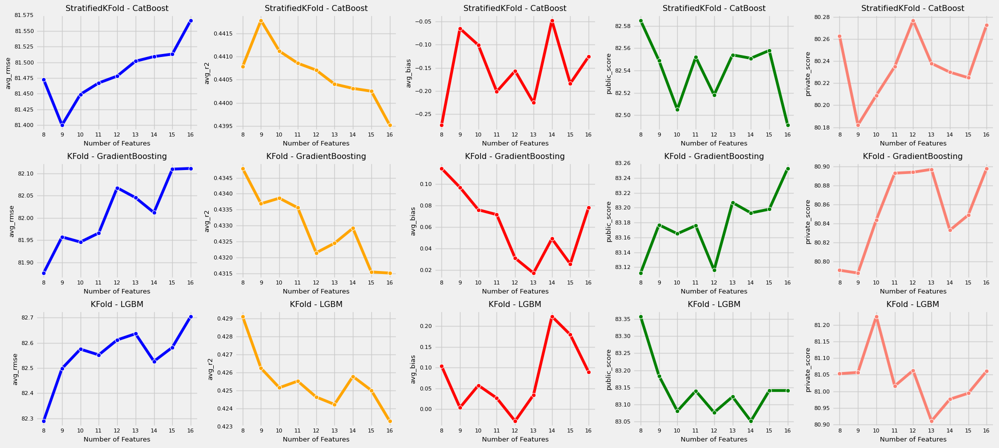

In [ ]:
preds_df = pd.DataFrame(preds)
features = ['avg_rmse', 'avg_r2', 'avg_bias', 'public_score', 'private_score']
plot_features(features, plot_type='scores', data=preds_df)

## **`5.` Stacking Meta-Model**
<a name="oof"></a>

Three different machine learning models are combined to obtain ensemble predictions by selecting the best-performing predictions from the validation phase for each model. **Ridge Regression** optimization is implemented using the **Optuna** library to enhance the performance of the stacking model, aiming to improve accuracy by leveraging the strengths of various predictive models through stacking.

In [ ]:
# Keep OOF estimates and test estimates of all models
oof_preds_list = []
test_preds_list = []
preds_indexes = [7,15,23]

for i in preds_indexes:
    oof_preds_list.append(preds[i]['oof_preds'])
    test_preds_list.append(preds[i]['pred'])

In [ ]:
# Objective function for regression optimization using Optuna
def objective_regression(trial, X_stack, y_stack, model_type='Ridge', n_splits=9):
   # Alpha parameter
    alpha = trial.suggest_float("alpha", 1e-4, 1e2, log=True)

    # Create model
    if model_type == 'Ridge':
        model = data_imputer.get_regressor('Ridge', params={'alpha': alpha})
    elif model_type == 'Lasso':
        model = data_imputer.get_regressor('Lasso', params={'alpha': alpha})
    else:
        raise ValueError("model_type must be 'Ridge' or 'Lasso'")

    # K-Fold cross-validation
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=seed)
    scores = cross_val_score(model, X_stack, y_stack, scoring="neg_mean_squared_error", cv=kf, n_jobs=-1)

    return np.mean(scores)

def optimize_regression(X_stack, y_stack, model_type='Ridge', n_trials=50):
    # Optimization function for Ridge and Lasso
    study = optuna.create_study(direction="maximize")
    study.optimize(lambda trial: objective_regression(trial, X_stack, y_stack, model_type=model_type), n_trials=n_trials)

    # Return the best parameters
    return study.best_params, study.best_value

def stack_and_predict(oof_preds, y, test_preds, n_trials=10, use_ridge=True, use_lasso=False):
    # Prediction with Stacking and hyperparameter tuning

    # Combine OOF predictions and test predictions
    X_stack = np.column_stack(oof_preds)
    y_stack = y

    # Add the fold estimates of each model as columns
    X_test_stack = np.column_stack([np.mean(pred_list, axis=0) for pred_list in test_preds])

    model = None
    if use_ridge:
        best_ridge_params, best_ridge_value = optimize_regression(X_stack, y_stack, model_type='Ridge', n_trials=n_trials)
        print(f"Best Ridge score: {best_ridge_value}")

        # Train Ridge model with the best parameters
        model = data_imputer.get_regressor('Ridge', params=best_ridge_params)

    elif use_lasso:
        best_lasso_params, best_lasso_value = optimize_regression(X_stack, y_stack, model_type='Lasso', n_trials=n_trials)
        print(f"Best Lasso score: {best_lasso_value}")

        # Train Lasso model with the best parameters
        model = data_imputer.get_regressor('Lasso', params=best_lasso_params)

    else:
        print("Neither Ridge nor Lasso optimization was used.")
        # Option to use simple Linear Regression
        model = LinearRegression()

    model.fit(X_stack, y_stack)

    # Predictions on test data
    final_predictions = model.predict(X_test_stack)

    return final_predictions

# Use OOF predictions and test predictions for stacking
final_test_predictions = stack_and_predict(oof_preds_list, y, test_preds_list, n_trials=50, use_ridge=True, use_lasso=False)


## **`6.` Submission Files**
<a name="submission"></a>

In [ ]:
# Calculate the average (mean) of predictions
def prediction_mean(preds, selected_folds=None):
    if selected_folds is not None:
        selected_predictions = [preds[i] for i in selected_folds]
        final_prediction_mean = np.mean(np.column_stack(selected_predictions), axis=1)
        return final_prediction_mean

    final_prediction_mean = np.mean(np.column_stack(preds), axis=1)
    return final_prediction_mean

In [ ]:
# Assign prediction to ss and download files
for pred in preds:
    prediction = prediction_mean(pred['pred'])
    ss[TARGET]= prediction

    file_name = f'{pred["model_name"]}_{len(pred["feats"])}features_{pred["split"]}split_{pred["Fold"]}.csv'
    ss.to_csv(file_name, index=False)

    files.download(file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Average predictions of specific folds
prediction = prediction_mean(preds[9]['pred'], selected_folds=[5,7])
ss[TARGET]= prediction

<Axes: >

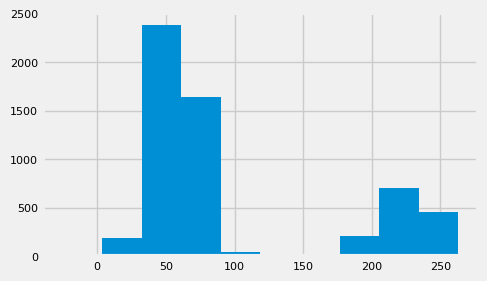

In [ ]:
# OOF prediction
ss[TARGET]= final_test_predictions
ss[TARGET].hist()

In [ ]:
ss.to_csv('submission_best_oof_.csv', index=False)
files.download('submission_best_oof_.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **`6.` Conclusion**
<a name="conclusion"></a>

**Imputation Strategy and Model Evaluation**

During the imputation phase, both categorical and numerical features were examined to determine whether they had significant relationships with other features. Group-based imputation was tested to assess its effectiveness, alongside traditional imputation methods. For both categorical and numerical variables, group-based imputation was incorporated as an additional technique.

To evaluate the effectiveness of each imputation strategy, the initial analysis was conducted using a train_test_split approach. The RMSE values for each model were used as a metric to identify the most suitable imputation techniques.

|Model|Categorical Imputation|Numerical Imputation|RMSE|
|---|---|---|---|
|CatBoost|Constant Categorical|KNN|83\.3924|
|LGBM|Constant Categorical|Simple Mean|83\.8968|
|GradientBoosting|Group Mode|KNN|82\.8678|
|ExtraTrees|Constant Categorical|KNN|89\.0288|
|XGB|Constant Categorical|Simple Median|87\.4577|
|AdaBoost|Constant Categorical|Simple Median|93\.4804|
|DecisionTree|Group Mode|Simple Mean|119\.4029|
|RandomForest|Constant Categorical|Simple Median|87\.6868|
|MLPRegressor|Simple Categorical|Simple Mean|88\.6755|

**Cross-Validation and Feature Selection**

Feature selection played a crucial role in the data analysis phase. Techniques like mutual information and correlation analysis were employed to gauge the informational value of each feature. This facilitated a better understanding of relationships among features and their connection to the target variable, guiding the identification of informative features. Additionally, features with high correlation to the target were analyzed using **KMeans** clustering, with the number of clusters determined by evaluating the **Silhouette Score** and the **Davies-Bouldin Index**. New features were created by grouping variables like bmi and density into clusters, resulting in enhanced feature representation. Prior to imputation, redundant and noisy features were removed, aiding in the identification of the best imputation methods.

In the prediction phase, the models were further evaluated using 9-fold cross-validation, which consistently provided the best scores. For the CatBoost model, the best-performing imputation combination was determined by splitting the data into 9 folds using cross_val_score. The optimal imputation strategy for CatBoost was found to be **Constant Categorical and Simple Mean,** yielding an RMSE of 82.5834 with a standard deviation of 1.9870.

The initial selection of the 16 features was based on CatBoost's **SHAP (SHapley Additive exPlanations)** values, which provided a measure of feature importance, allowing the identification of features with the highest predictive value. This ensures that the explanation remains accurate regarding the feature selection process. Using **RFECV (Recursive Feature Elimination with Cross-Validation)**, it was observed that GradientBoosting benefited the most from this approach, showing improved model performance. Specifically, RFECV yielded a public score of 83.348 and a private score of 80.857 for GradientBoosting. When using features selected by CatBoost, GradientBoosting produced even better results, indicating that features ranked highly by CatBoost also aligned well with the strengths of the GradientBoosting model. In the modelling phase, feature selection and reduction were key components. The process began with 16 chosen features guided by SHAP, including the following features:

- breast_cancer_diagnosis_desc
- breast_cancer_diagnosis_code
- metastatic_cancer_diagnosis_code
- patient_age
- payer_type
- patient_zip3
- patient_race
- patient_state
- education_some_college
- education_bachelors
- race_white
- race_other
- divorced
- income_household_15_to_20
- health_uninsured
- labor_force_participation


 Using Backward Elimination, the feature set was gradually reduced from 16 to 9 optimal features, with the elimination process also guided by **SHAP** values to ensure that only the most impactful predictors were retained:
- breast_cancer_diagnosis_desc
- breast_cancer_diagnosis_code
- metastatic_cancer_diagnosis_code
- patient_age
- payer_type
- patient_zip3
- patient_race
- patient_state
- education_some_college

These 9 features achieved the lowest RMSE and highest R² scores, indicating their robustness in prediction. The models trained with this reduced feature set yielded strong predictions, with CatBoost and GradientBoosting models demonstrating great performance. However, LGBM did not perform as well with this specific feature set.


|Model|Avg\. RMSE|Avg\. R2|Public RMSE|Private RMSE|
|---|---|---|---|---|
|CatBoost|81\.4|0\.4418|82\.549|80\.182|
|GradientBoosting|81\.9573|0\.4337|83\.177|80\.788|
|LGBM|82\.4978|0\.4262|83\.184|81\.057|

LGBM achieved its best results (RMSE public 83.123 | private 80.910) with a slightly larger feature set of 13 variables.

The best performance was achieved with data imputed using **Constant Categorical** for categorical features and **No Numerical Imputation** for numerical features. The CatBoost model trained on this dataset produced the highest scores based on feature importance ranking, utilizing the following 13 top features:

- breast_cancer_diagnosis_desc
- patient_age
- metastatic_cancer_diagnosis_code
- payer_type
- breast_cancer_diagnosis_code
- patient_race
- bmi
- education_highschool
- commute_time
- education_stem_degree
- income_household_35_to_50
- patient_state
- patient_zip3

Using a 9-split StratifiedKFold with grouping based on breast_cancer_diagnosis_code, the model achieved an average RMSE of 81.5749 and an average R² of 0.4394. The public score was 82.587, while the private score reached 80.225. By averaging the predictions from the 5th and 7th folds—both of which produced the best individual scores—the public score was slightly adjusted to 82.709, and the private score improved to 80.154.

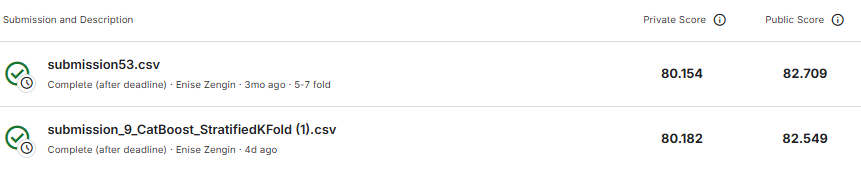

**Model Training and Performance Assessment**

For training, KFold and StratifiedKFold cross-validation methods were applied. Results indicated that StratifiedKFold was beneficial for CatBoost, while KFold proved advantageous for GradientBoosting and LGBM. The evaluation of model predictions on the test set highlighted cross-validation as the most reliable method, with fold-specific score monitoring aiding in comprehensive performance assessment. The selection of n_splits was optimized by examining outputs to identify the optimal configuration.

When applying StratifiedKFold, the results obtained using **breast_cancer_diagnosis_desc** were either comparable to or superior to those achieved with **breast_cancer_diagnosis_code**, depending on the features used during model training.

After feature selection, hyperparameter tuning was performed, yielding the best parameters: **{'border_count': 50, 'ctr_target_border_count': 10, 'depth': 8, 'l2_leaf_reg': 3, 'learning_rate': 0.3, 'n_estimators': 1000}**. However, testing with these optimized parameters did not lead to improved performance. Interestingly, using ctr_target_border_count alone resulted in better outcomes for the model compared to the full set of tuned parameters. A similar trend was observed for other models as well, where default parameters outperformed the optimized configurations.

After employing a 9-fold cross-validation for the imputation phase, using **Constant Categorical and Simple Mean**, the optimal features were determined. These top 9 features provided the lowest RMSE scores. Interestingly, the same set of 9 features, when imputed with **Constant Categorical and KNN**, yielded identical features but in a different order:

Feature Order (from Constant Categorical and Simple Mean):
- breast_cancer_diagnosis_desc
- patient_age
- metastatic_cancer_diagnosis_code
- breast_cancer_diagnosis_code
- payer_type
- patient_zip3
- patient_race
- education_some_college

Continuing with the selected 9 features, the models were trained again, yielding the following results:

|Model|Avg\. RMSE|Avg\. R2|Public RMSE|Private RMSE|
|---|---|---|---|---|
|CatBoost|81\.4346|0\.4413|82\.549|80\.185|
|GradientBoosting|81\.9591|0\.4337|83\.176|80\.788|
|LGBM|82\.4978|0\.4262|83\.184|81\.057|

This consistency in feature selection demonstrates the robustness of the chosen features, regardless of the imputation technique, emphasizing their importance for predictive accuracy.

**Ensemble Approach**

To enhance prediction accuracy, models were combined into an ensemble framework. For the meta model, hyperparameter optimization involved cross-validation and was conducted through Optuna. Ridge, Lasso, and Linear Regression models were considered for meta-modeling. The imputation process required additional preprocessing to align different models with distinct data structures, leading to the development of a dedicated notebook to manage these operations.

To further enhance accuracy, the best-performing regressions were ensembled. The combination of CatBoost and GradientBoosting models produced a strong private score of 80.217. Adding LGBM to the ensemble slightly increased the score to 80.222. Despite the marginal difference, the ensemble approach demonstrated the value of integrating diverse models to achieve more robust predictions.

|Models|Public RMSE|Private RMSE|
|---|---|---|
|CatBoost + GradientBoosting + LGBM|82\.576|80\.222|
|CatBoost + GradientBoosting|82\.584|80\.217|

# **`7.` References and Acknowledgments**
<a name="references"></a>

A heartfelt thank you to everyone who contributed to the discussion forums and shared their valuable insights throughout the competition. The following resources were especially helpful:

- [Embracing Diversity and Robustness by Simona Gradinaru](https://www.kaggle.com/code/simonagradinaru/wids-24-2-embracing-diversity-robustness)

- [1st Place Solution by Ogwalakello](https://www.kaggle.com/code/ogwalakello/wids-datathon-2024-1st-place-solution?scriptVersionId=182110288)

- [ICD-9 Data](http://www.icd9data.com/2012/Volume1/140-239/170-176/174/default.htm)

- [ICD-9 Codes](https://www.maine.gov/pfr/insurance/sites/maine.gov.pfr.insurance/files/inline-files/exhibit_c_mgara_auto_cede_conditions.pdf)

- [ICD-10 Data](https://www.icd10data.com/ICD10CM/Codes/C00-D49/C50-C50/C50-)

A special thanks to Lina Gomez for her valuable collaboration and insightful discussions during the process.
- [Lina Gomez's GitHub Repository
](https://github.com/LinaGomez-lab/Prediction_Model_Cancer_Met)